# Nvidia Stocks Price Prediction 
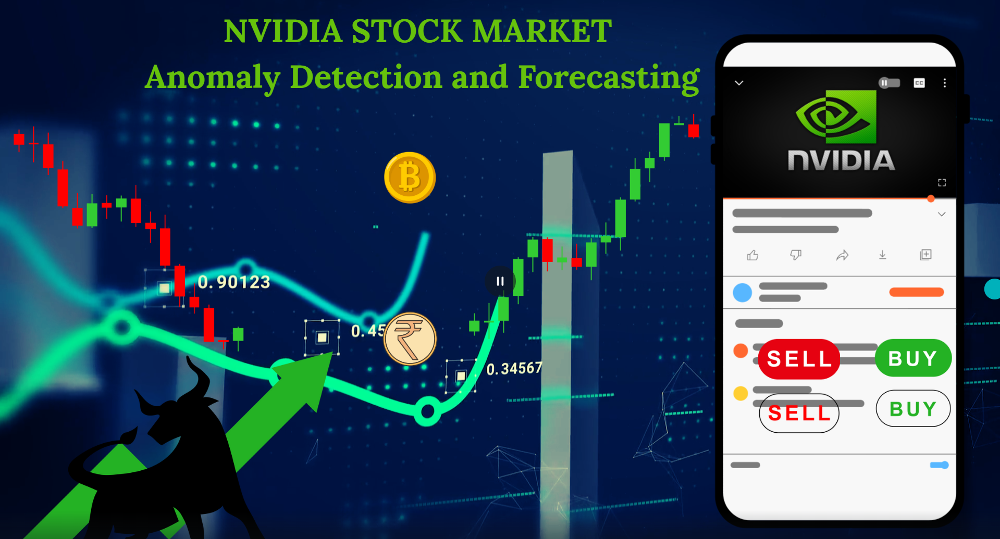

In [160]:
!pip install yfinance

DEPRECATION: Loading egg at c:\users\drsnc\anaconda3\lib\site-packages\addict-2.4.0-py3.11.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..
DEPRECATION: Loading egg at c:\users\drsnc\anaconda3\lib\site-packages\docker_pycreds-0.4.0-py3.11.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..
DEPRECATION: Loading egg at c:\users\drsnc\anaconda3\lib\site-packages\mmcv_full-1.7.2-py3.11-win-amd64.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..
DEPRECATION: Loading egg at c:\users\drsnc\anaconda3\lib\site-packages\prettytable-3.10.0-py3.11.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..
DEPRECATION: Loading egg at c:\users\drsnc\anaconda3\lib\site-packages\sentry_sdk-2.1.1-py3.11.eg

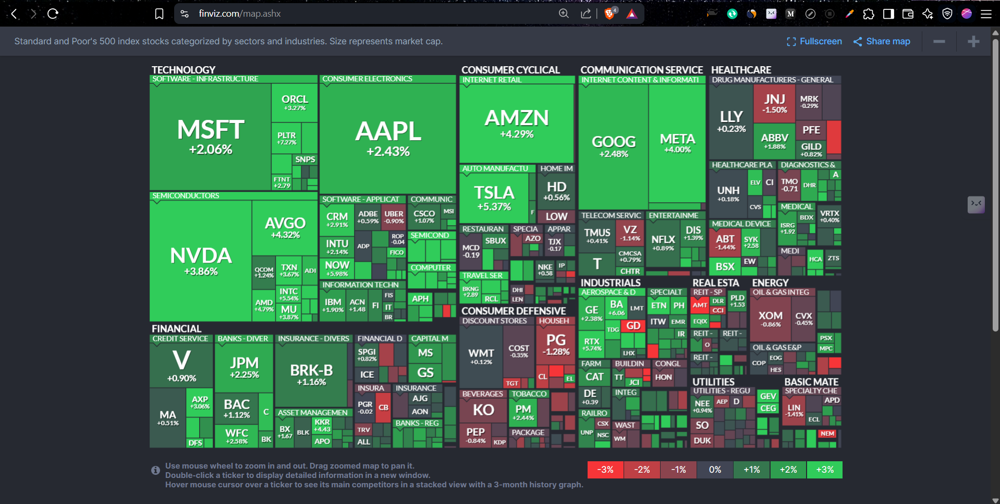

In [161]:
import yfinance as yf

# Download historical data for a stock (e.g., Apple)
ticker = "NVDA"
data = yf.download(ticker, start="2022-01-01", end="2025-04-23")

# Save to CSV for reproducibility
data.to_csv(f"{ticker}_historical.csv")

[*********************100%***********************]  1 of 1 completed



Some popular ticker symbols include:

- AAPL: Apple Inc.
- GOOG: Alphabet Inc. (Google)
- MSFT: Microsoft Corporation
- AMZN: Amazon.com, Inc.
- Meta: Meta Platforms, Inc. (Facebook)

for knowing more about popular tickers, please refer to https://finviz.com/
# Here , we are refering to NVIDIA Stocks

# Task

1. Data Preprocessing
Clean data: handle missing/null values and outliers.
Feature engineering: derive returns, volatility, and rolling averages.
Normalize or scale data as required for anomaly detection models.

2. Anomaly Detection & Handling
Apply isolation Forest, DBSCAN and LOF to detect anomalies.
Compare performance based on domain relevance and interpretability.
Visualize anomalies over time on stock price plots.

3. Time Series Analysis
Decompress series into trend, seasonality, and residuals using STL decomposition.
Test for stationarity using ADF Test, visualize ACF and PACF plots.
Apply necessary transformations(e.g., differencing) to make the series stationary.

4. Model Building
Build AR, MA, ARIMA models for baseline forecasting.
Improve model with seasonal versions: SARIMA/SARIMAX.
Tune model parameters using AIC/BIC and grid search.

5. Model Evaluation
Evaluate forecast accuracy using  RMSE.
Perform residual diagnostics to ensure randomness and stationarity.
Backtest models to compare predicted vs. actual data.

6. Visualization
Plot detected anomalies on historical charts.
Visualize actual vs forecasted stock prices.

Expected Outcomes:
Identification of periods with usual market activity (e.g., price spikes, crashes).
Comparative analysis of multiple anomaly detection methods on stock price data.
Accurate short-term stock price forecasts using advanced time series models.
Insightful visualizations showing trends, seasonality, and detected anomalies.
A robust and modular pipeline for ongoing anomaly monitoring and forecasting.
and give conclusion .

Here is all the data you need:
"NVDA_historical.csv"

##  Import libraries for data retrieval and manipulation

In [162]:
import yfinance as yf  # For retrieving stock data from Yahoo Finance
import pandas as pd  # For data manipulation and analysis
import numpy as np  # For numerical computations

# Import libraries for data visualization
import matplotlib.pyplot as plt  # For creating plots and visualizations

# Import libraries for machine learning and anomaly detection
from sklearn.preprocessing import StandardScaler  # For scaling data
from sklearn.ensemble import IsolationForest  # For anomaly detection
from sklearn.cluster import DBSCAN  # For clustering and anomaly detection
from sklearn.metrics import silhouette_score  # For evaluating clustering performance
from sklearn.neighbors import NearestNeighbors  # For finding nearest neighbors
from sklearn.neighbors import LocalOutlierFactor  # For anomaly detection

# Import libraries for time series analysis
from statsmodels.tsa.stattools import adfuller  # For Augmented Dickey-Fuller test
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf  # For plotting ACF and PACF
from statsmodels.tsa.seasonal import seasonal_decompose  # For decomposing time series
from statsmodels.tsa.arima.model import ARIMA  # For ARIMA modeling

# Suppress warnings
import warnings

# Suppress warnings
warnings.filterwarnings('ignore')


In [163]:
# Load the data

df = pd.read_csv('NVDA_historical.csv', skiprows=2)
df.columns = ['Date',  'Close', 'High', 'Low','Open', 'Volume']

# Display first few rows
df.head()

,Date,Close,High,Low,Open,Volume
0,2022-01-03,30.068222,30.657188,29.732810,29.762758,391547000
1,2022-01-04,29.238678,30.414613,28.299327,30.223948,527154000
2,2022-01-05,27.555635,29.364461,27.484761,28.898278,498064000
3,2022-01-06,28.128624,28.388169,27.017575,27.591567,454186000
4,2022-01-07,27.199257,28.372199,27.009589,28.091691,409939000


In [164]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 828 entries, 0 to 827
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    828 non-null    object 
 1   Close   828 non-null    float64
 2   High    828 non-null    float64
 3   Low     828 non-null    float64
 4   Open    828 non-null    float64
 5   Volume  828 non-null    int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 38.9+ KB


Here Date column is Object , so we have to convert this into Datetime.

In [165]:
# Data cleaning and preparation
def preprocess_data(df):

    # Convert all numeric columns to float
    numeric_cols = [ 'Close', 'High', 'Low', 'Open', 'Volume']
    df[numeric_cols] = df[numeric_cols].astype(float)

    # Check for duplicates
    print(f"Number of duplicate rows: {df.duplicated().sum()}")

    # Check for missing values
    print("\nMissing values per column:")
    print(df.isnull().sum())

    return df

df = preprocess_data(df)

# We'll focus on the 'Close' price for our analysis
stock_data = df[['Date','Close','Volume']].dropna()

Number of duplicate rows: 0

Missing values per column:
Date      0
Close     0
High      0
Low       0
Open      0
Volume    0
dtype: int64


In [166]:
df

,Date,Close,High,Low,Open,Volume
0,2022-01-03,30.068222,30.657188,29.732810,29.762758,391547000.0
1,2022-01-04,29.238678,30.414613,28.299327,30.223948,527154000.0
2,2022-01-05,27.555635,29.364461,27.484761,28.898278,498064000.0
3,2022-01-06,28.128624,28.388169,27.017575,27.591567,454186000.0
4,2022-01-07,27.199257,28.372199,27.009589,28.091691,409939000.0
...,...,...,...,...,...,...
823,2025-04-15,112.199997,113.620003,110.500000,110.970001,228966900.0
824,2025-04-16,104.489998,106.790001,100.449997,104.550003,397016900.0
825,2025-04-17,101.489998,104.470001,100.050003,104.449997,290833400.0
826,2025-04-21,96.910004,99.440002,95.040001,98.769997,288501100.0


In [167]:
stock_data.head(7)

,Date,Close,Volume
0,2022-01-03,30.068222,391547000.0
1,2022-01-04,29.238678,527154000.0
2,2022-01-05,27.555635,498064000.0
3,2022-01-06,28.128624,454186000.0
4,2022-01-07,27.199257,409939000.0
5,2022-01-10,27.351992,594681000.0
6,2022-01-11,27.768259,404089000.0


In [168]:
stock_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 828 entries, 0 to 827
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    828 non-null    object 
 1   Close   828 non-null    float64
 2   Volume  828 non-null    float64
dtypes: float64(2), object(1)
memory usage: 19.5+ KB


In [169]:
# Convert the 'Date' column to datetime format
stock_data["Date"] = pd.to_datetime(stock_data["Date"])

# Set the 'Date' column as the index of the DataFrame
stock_data = stock_data.set_index("Date")

# Sort the DataFrame by the index (date) in ascending order
stock_data.sort_index(inplace=True)

# Display the first few rows of the DataFrame
stock_data.head()


,Close,Volume
Date,,
2022-01-03,30.068222,391547000.0
2022-01-04,29.238678,527154000.0
2022-01-05,27.555635,498064000.0
2022-01-06,28.128624,454186000.0
2022-01-07,27.199257,409939000.0


In [170]:
stock_data.tail()

,Close,Volume
Date,,
2025-04-15,112.199997,228966900.0
2025-04-16,104.489998,397016900.0
2025-04-17,101.489998,290833400.0
2025-04-21,96.910004,288501100.0
2025-04-22,98.889999,241004800.0


In [171]:
stock_data.to_csv('NVDA_stocks.csv')

# EDA
### 📊 1. Summary Statistics  
Get a quick overview of your time series data by calculating key statistics:  
- **Mean**, **Median**, **Mode**, and **Standard Deviation**  
These metrics help understand the central tendency and dispersion of the data.

---

### 📈 2. Visualize the Time Series Data  
Visualizations are crucial for spotting trends, seasonality, and anomalies:  
- 📊 Plot the **Time Series** data  
- 📉 Plot the **Rolling Mean** and **Rolling Standard Deviation**  
- 🔍 **Decompose** the time series to examine:  
  - Trend  
  - Seasonality  
  - Residuals (Noise)  
- 📃 Visualize the decomposed components for deeper insights

---

### 🧪 3. Stationarity Check  
Ensure the time series is stationary (a requirement for many forecasting models):  
- ✅ Perform a **Visual Check** for stationarity  
- 📉 Apply the **Augmented Dickey-Fuller (ADF) Test** to statistically confirm stationarity

---

### 🔁 4. Check for Autocorrelation  
Understand dependencies in the data to determine the ARIMA model order:  
- 🔍 Plot the **Autocorrelation Function (ACF)**  
- 📉 Plot the **Partial Autocorrelation Function (PACF)**

---

### ⚠️ 5. Outlier Detection  
Identify and manage anomalies that could skew your analysis:  
- 📏 Use **statistical methods** (e.g., z-score, IQR)  
- 🤖 Apply **machine learning techniques**
---

### ♻️ 6. Repeat Autocorrelation Check (if needed)  
(If transformations or outlier handling modified the data)  
- 🔄 Re-plot **ACF** and **PACF** to reassess model order suitability

---




In [172]:
stock_data.describe()

,Close,Volume
count,828.000000,8.280000e+02
mean,60.542406,4.494888e+08
std,44.885777,1.700559e+08
min,11.214938,1.051570e+08
25%,21.464488,3.392731e+08
50%,43.931637,4.351965e+08
75%,107.198580,5.412862e+08
max,149.416245,1.543911e+09


The analysis of NVIDIA's historical stock data reveals significant fluctuations in both closing prices and trading volumes. With a mean closing price of 60.54USD and a standard deviation of 44.89USD, the stock has shown considerable volatility. The trading volume has also varied widely, averaging around 449.5 million shares. These insights can inform investment decisions, risk assessments, and further analysis into market trends and anomalies.

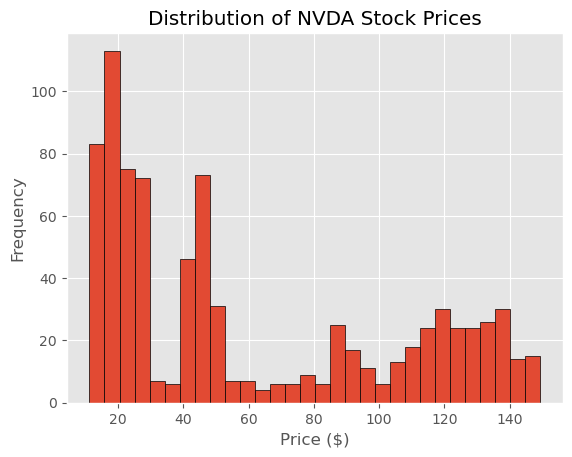

In [173]:
# Create a histogram to visualize the distribution of stock prices
plt.hist(stock_data['Close'], bins=30, edgecolor='k')

# Set the title of the plot
plt.title('Distribution of NVDA Stock Prices')

# Set the labels for the x and y axes
plt.xlabel('Price ($)')
plt.ylabel('Frequency')

# Display the plot
plt.show()


## Key Details

- **$10–$30**: Highest frequency — early low-price trading.
- **$40–$55**: Noticeable second peak — post-split growth phase.
- **$60–$150+**: Long right tail with smaller spikes — recent rallies and volatility.

---

## Bottom Line

NVIDIA’s prices have steadily shifted from low-tens into triple digits, reflecting major growth phases; however, the high-price tail also signals increased volatility at today’s elevated levels.


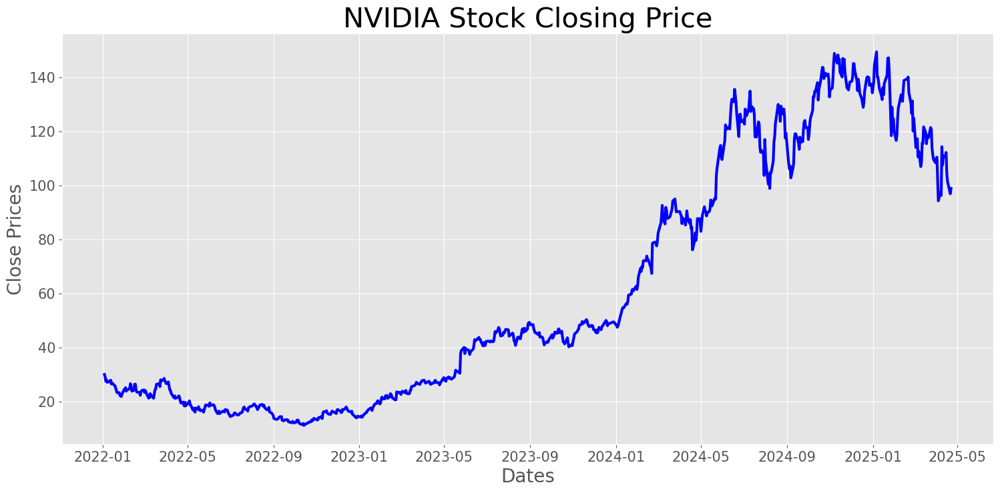

In [174]:
# Set the plot style to 'ggplot' for visualization
plt.style.use('ggplot')

# Create a figure with a specified size
plt.figure(figsize=(18, 8))

# Enable grid lines for better readability
plt.grid(True)

# Set labels and font sizes for the x and y axes
plt.xlabel('Dates', fontsize=20)
plt.xticks(fontsize=15)
plt.ylabel('Close Prices', fontsize=20)
plt.yticks(fontsize=15)

# Plot the closing prices with specified line width and color
plt.plot(stock_data['Close'], linewidth=3, color='blue')

# Set the title of the plot with a specified font size
plt.title('NVIDIA Stock Closing Price', fontsize=30)

# Display the plot
plt.show()


## Detailed Analysis

1. **2022 Bear Market**  
   - NVIDIA fell from \$28–\$30 to just above \$12 by late 2022, hit by tech sell-offs, interest rate hikes, and recession fears.

2. **2023 Base Building & Rebound**  
   - Stock stabilized between \$15–\$25 early in 2023. Breakout began mid-year, crossing \$30 and reaching \$40–\$45 as AI optimism returned.

3. **2024 Bull Run**  
   - Massive surge from \$50 to \$90 (Jan–Apr ’24), driven by AI chip demand. Despite volatility, NVDA hit record highs near \$150 by year-end.

4. **2025 Pullback & Current Range**  
   - After peaking, stock corrected to \$100–\$120, where strong support has emerged, keeping the broader uptrend alive.

---

## Conclusion

NVIDIA’s journey shows a sharp 2022 decline, a 2023 recovery phase, and a powerful 2024 AI-fueled rally. Though the trend remains bullish, ongoing 15–25% swings highlight the need for caution in future positioning.


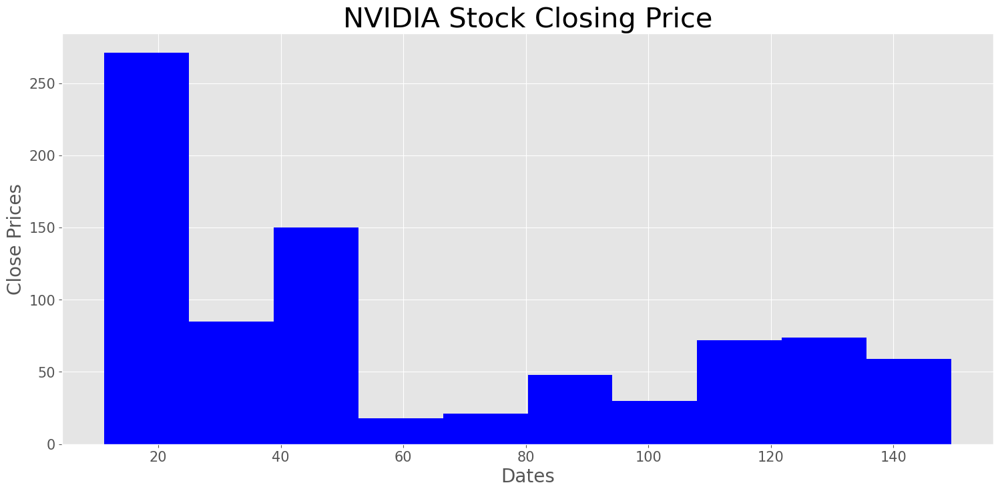

In [175]:
# Setting the plot style
plt.style.use('ggplot')
# Creating a figure with specific size
plt.figure(figsize=(18, 8))

# Adding grid to the plot for better readability
plt.grid(True)

# Setting x-axis label and font size
plt.xlabel('Dates', fontsize=20)
# Setting x-axis tick font size
plt.xticks(fontsize=15)

# Setting y-axis label and font size
plt.ylabel('Close Prices', fontsize=20)
# Setting y-axis tick font size
plt.yticks(fontsize=15)

# Plotting the histogram of the 'Close' prices
plt.hist(stock_data['Close'], linewidth=3, color='blue')

# Adding the title to the plot
plt.title('NVIDIA Stock Closing Price', fontsize=30)

# Displaying the plot
plt.show()


## Detailed Breakdown

1. **Low-Price Cluster (\$10–\$20)**  
   - Tallest peak near \$12–\$15, reflecting NVIDIA’s 2022 bear market.

2. **Mid-Range Peak (\$40–\$50)**  
   - Strong second hump around \$45–\$50, matching the 2023 recovery and breakout.

3. **High-Price Modes (\$100–\$150)**  
   - Multiple smaller peaks between \$100–\$150, tied to the 2024 rally and early-2025 correction.

4. **Multi-Modal Structure**  
   - Three distinct humps map NVIDIA’s growth phases; a long right tail signals increased volatility at high valuations.

---

## Conclusion

NVIDIA’s histogram charts a clear shift: deep 2022 lows, steady 2023 breakout, and a volatile 2024–2025 bull run. While gains have been strong, the rising price levels also bring bigger, sharper swings.


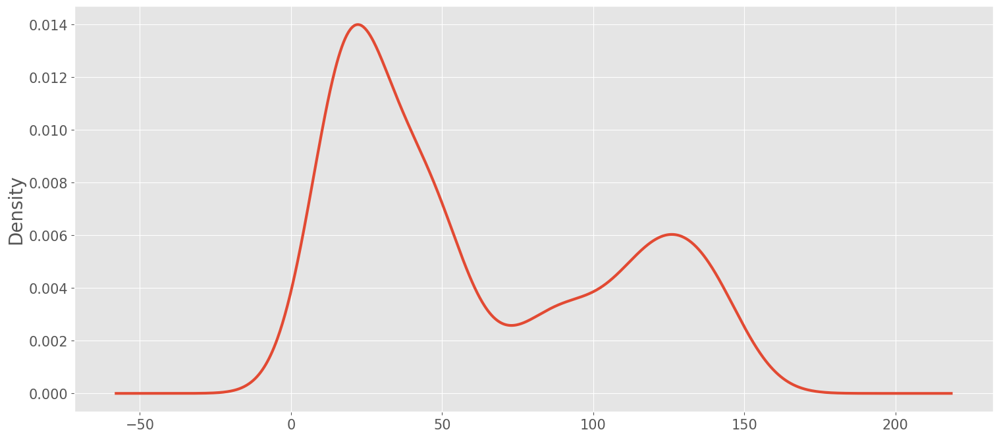

In [176]:
# Plotting the distribution of NVIDIA's closing prices
df_close = stock_data['Close']  # Extract the 'Close' price series
df_close.plot(kind='kde', figsize=(18,8), linewidth=3)  # Kernel Density Estimation plot with thicker line
plt.xticks(fontsize=15)  # Increase font size for x-axis labels
plt.grid("both")  # Enable both major and minor grid lines
plt.ylabel('Density', fontsize=20)  # Set y-axis label with larger font
plt.yticks(fontsize=15)  # Increase font size for y-axis labels
plt.show()  # Display the plot


## Detailed Analysis

1. **Bimodal Shape**  
   - **First Peak (~\$25–\$30):** Reflects the low-price period of 2022–2023.  
   - **Second Peak (~\$120–\$130):** Represents the surge during the 2024 AI-driven rally.

2. **Trough & Transition (~\$60–\$80)**  
   - The valley between \$60 and \$80 marks the transition from 2023’s consolidation to 2024’s breakout.

3. **Skew & Tail Behavior**  
   - The right tail stretches past \$150, showing occasional ultra-high closes with diminishing frequency.  
   - Little to no density below \$10 or above \$200 highlights rare extremes.

---

## Conclusion

The KDE reflects NVIDIA’s shift from a low-price regime around 25 to a high-price cluster near 125, highlighting key market phases. Investors should recognize these regime boundaries rather than focusing on a single average price.


# 2. FEATURE ENGINEERING

In [177]:
# Load NVIDIA historical stock data, skipping the first two rows
df = pd.read_csv('NVDA_historical.csv', skiprows=2)

# Rename columns for consistency and clarity
df.columns = ['Date', 'Close', 'High', 'Low', 'Open', 'Volume']

# Convert the 'Date' column to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' as the index of the DataFrame
df.set_index('Date', inplace=True)

# Sort the DataFrame by the date index in ascending order
df.sort_index(inplace=True)

# Display the prepared DataFrame
df


,Close,High,Low,Open,Volume
Date,,,,,
2022-01-03,30.068222,30.657188,29.732810,29.762758,391547000
2022-01-04,29.238678,30.414613,28.299327,30.223948,527154000
2022-01-05,27.555635,29.364461,27.484761,28.898278,498064000
2022-01-06,28.128624,28.388169,27.017575,27.591567,454186000
2022-01-07,27.199257,28.372199,27.009589,28.091691,409939000
...,...,...,...,...,...
2025-04-15,112.199997,113.620003,110.500000,110.970001,228966900
2025-04-16,104.489998,106.790001,100.449997,104.550003,397016900
2025-04-17,101.489998,104.470001,100.050003,104.449997,290833400


In [178]:
# 2. BACKUP RAW CLOSE (for later comparison)
# Create a backup of the 'Close' column under the name 'Close_raw'
df["Close_raw"] = df["Close"].copy()

# 3. FEATURE ENGINEERING (for anomaly detection)
# Calculate the daily return as a percentage change in the 'Close' price
df["Daily_Return"] = df["Close"].pct_change() * 100

# Calculate the rolling volatility using a 10-day window
df["Volatility"] = df["Close"].rolling(window=10, min_periods=1).std()

# Drop rows that have missing values for 'Daily_Return' or 'Volatility'
df = df.dropna(subset=["Daily_Return", "Volatility"])


# 4. ML-BASED ANOMALY DETECTION (on scaled features)

In [179]:
# Define the features to be normalized
features = ["Close", "Daily_Return", "Volatility", "Volume"]

# Create a StandardScaler object and fit it to the data
scaler = StandardScaler().fit(df[features])

# Transform the data using the scaler
X_scaled = scaler.transform(df[features])


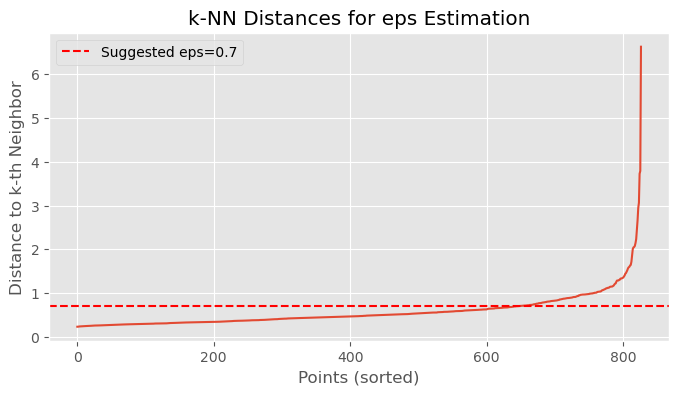


DBSCAN Parameter Tuning Results:
    eps  min_samples  silhouette_score  anomaly_ratio
2   0.5           15          0.631420       0.391778
1   0.5           10          0.601724       0.292624
7   0.7           20          0.565760       0.215236
6   0.7           15          0.534764       0.168077
5   0.7           10          0.513510       0.126965
3   0.5           20          0.340598       0.510278
4   0.7            5          0.316520       0.071342
9   0.9           10          0.308339       0.053204
0   0.5            5          0.163801       0.182588
14  1.1           15         -1.000000       0.033857
18  1.3           15         -1.000000       0.019347
17  1.3           10         -1.000000       0.015719
16  1.3            5         -1.000000       0.013301
15  1.1           20         -1.000000       0.053204
10  0.9           15         -1.000000       0.087062
13  1.1           10         -1.000000       0.027811
12  1.1            5         -1.000000       0.0

{'eps': 0.7,
 'min_samples': 5,
 'score': 0.3165202796770655,
 'anomaly_ratio': 0.07134220072551391}

In [180]:
#  Anomaly Detection with DBSCAN Parameter Tuning
def tune_dbscan_parameters(X_scaled):

    # Step 3.1: Estimate eps using k-NN distances
    k = 10  # Use min_samples as k
    nbrs = NearestNeighbors(n_neighbors=k).fit(X_scaled)
    distances, _ = nbrs.kneighbors(X_scaled)
    k_distances = distances[:, k-1]  # Distance to k-th nearest neighbor
    k_distances = np.sort(k_distances)

    # Plot k-NN distances to find elbow
    plt.figure(figsize=(8, 4))
    plt.plot(k_distances)
    plt.title('k-NN Distances for eps Estimation')
    plt.xlabel('Points (sorted)')
    plt.ylabel('Distance to k-th Neighbor')
    plt.axhline(y=0.7, color='r', linestyle='--', label='Suggested eps=0.7')
    plt.legend()
    plt.show()

    # Step 3.2: Define parameter grid
    eps_values = np.arange(0.5, 1.5, 0.2)  # Range based on k-NN plot
    min_samples_values = [5, 10, 15, 20]  # Based on 2 * n_features (4 features)

    best_params = {'eps': 0, 'min_samples': 0, 'score': -1, 'anomaly_ratio': 0}
    results = []

    # Step 3.3: Grid search
    for eps in eps_values:
        for min_samples in min_samples_values:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X_scaled)
            anomaly_ratio = np.sum(labels == -1) / len(labels)

            # Calculate silhouette score (excluding noise points)
            if len(np.unique(labels[labels != -1])) > 1:  # Need at least 2 clusters
                score = silhouette_score(X_scaled[labels != -1], labels[labels != -1])
            else:
                score = -1  # Invalid clustering

            results.append({
                'eps': eps,
                'min_samples': min_samples,
                'silhouette_score': score,
                'anomaly_ratio': anomaly_ratio
            })

            # Update best parameters if silhouette score is higher and anomaly ratio is reasonable
            if score > best_params['score'] and 0.01 <= anomaly_ratio <= 0.1:
                best_params = {
                    'eps': eps,
                    'min_samples': min_samples,
                    'score': score,
                    'anomaly_ratio': anomaly_ratio
                }

    # Print results
    results_df = pd.DataFrame(results)
    print("\nDBSCAN Parameter Tuning Results:")
    print(results_df.sort_values(by='silhouette_score', ascending=False))

    print("\nBest Parameters:")
    print(f"eps: {best_params['eps']}, min_samples: {best_params['min_samples']}")
    print(f"Silhouette Score: {best_params['score']:.4f}")
    print(f"Anomaly Ratio: {best_params['anomaly_ratio']:.4f}")

    return best_params
tune_dbscan_parameters(X_scaled)


Based on the DBSCAN parameter tuning results, the best parameters for the model are:

- eps: 0.7
- min_samples: 5

These parameters yield a silhouette score of 0.3165 and an anomaly ratio of 0.0713.

The results suggest that the DBSCAN model is able to identify some structure in the data, but the relatively low silhouette score indicates that the clusters may not be well-separated. The anomaly ratio suggests that about 7.13% of the data points are identified as anomalies.


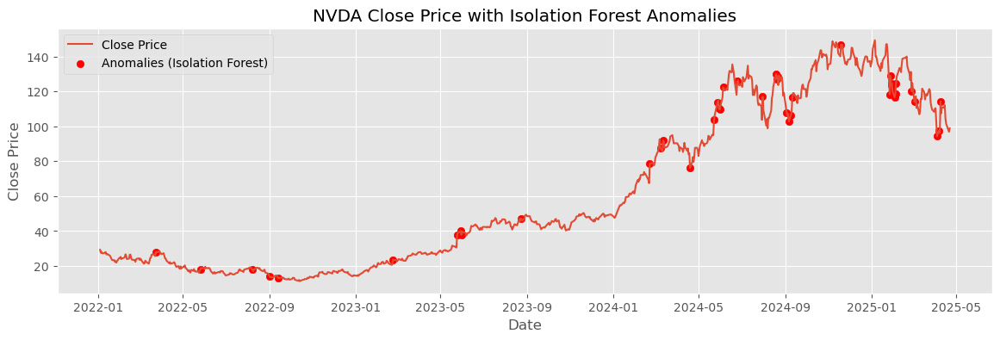

Isolation Forest detected 42 anomalies at dates:
 [Timestamp('2022-03-24 00:00:00'), Timestamp('2022-05-26 00:00:00'), Timestamp('2022-08-08 00:00:00'), Timestamp('2022-09-01 00:00:00'), Timestamp('2022-09-13 00:00:00'), Timestamp('2023-02-23 00:00:00'), Timestamp('2023-05-25 00:00:00'), Timestamp('2023-05-30 00:00:00'), Timestamp('2023-05-31 00:00:00'), Timestamp('2023-08-24 00:00:00'), Timestamp('2024-02-22 00:00:00'), Timestamp('2024-03-08 00:00:00'), Timestamp('2024-03-12 00:00:00'), Timestamp('2024-04-19 00:00:00'), Timestamp('2024-05-23 00:00:00'), Timestamp('2024-05-28 00:00:00'), Timestamp('2024-05-30 00:00:00'), Timestamp('2024-05-31 00:00:00'), Timestamp('2024-06-05 00:00:00'), Timestamp('2024-06-25 00:00:00'), Timestamp('2024-07-31 00:00:00'), Timestamp('2024-08-19 00:00:00'), Timestamp('2024-08-20 00:00:00'), Timestamp('2024-08-21 00:00:00'), Timestamp('2024-09-03 00:00:00'), Timestamp('2024-09-06 00:00:00'), Timestamp('2024-09-09 00:00:00'), Timestamp('2024-09-11 00:00:00'

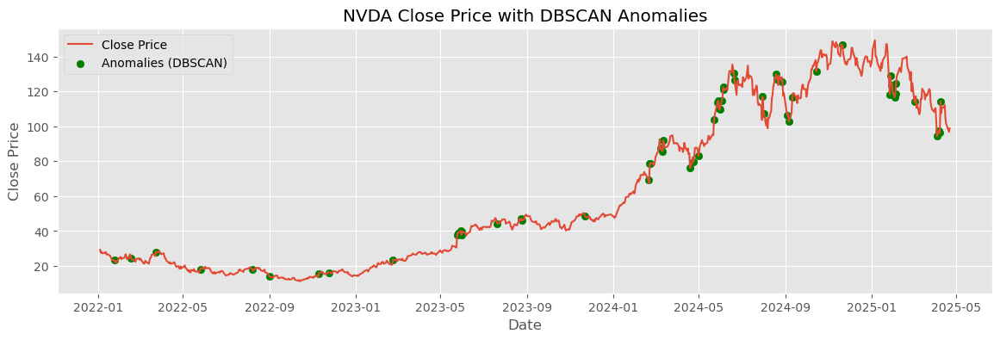

DBSCAN detected 59 anomalies at dates:
 [Timestamp('2022-01-24 00:00:00'), Timestamp('2022-02-17 00:00:00'), Timestamp('2022-03-24 00:00:00'), Timestamp('2022-05-26 00:00:00'), Timestamp('2022-08-08 00:00:00'), Timestamp('2022-09-01 00:00:00'), Timestamp('2022-11-10 00:00:00'), Timestamp('2022-11-25 00:00:00'), Timestamp('2023-02-23 00:00:00'), Timestamp('2023-05-25 00:00:00'), Timestamp('2023-05-26 00:00:00'), Timestamp('2023-05-30 00:00:00'), Timestamp('2023-05-31 00:00:00'), Timestamp('2023-06-01 00:00:00'), Timestamp('2023-07-21 00:00:00'), Timestamp('2023-08-24 00:00:00'), Timestamp('2023-08-25 00:00:00'), Timestamp('2023-11-22 00:00:00'), Timestamp('2024-02-20 00:00:00'), Timestamp('2024-02-22 00:00:00'), Timestamp('2024-02-23 00:00:00'), Timestamp('2024-03-08 00:00:00'), Timestamp('2024-03-11 00:00:00'), Timestamp('2024-03-12 00:00:00'), Timestamp('2024-04-19 00:00:00'), Timestamp('2024-04-24 00:00:00'), Timestamp('2024-05-01 00:00:00'), Timestamp('2024-05-23 00:00:00'), Timesta

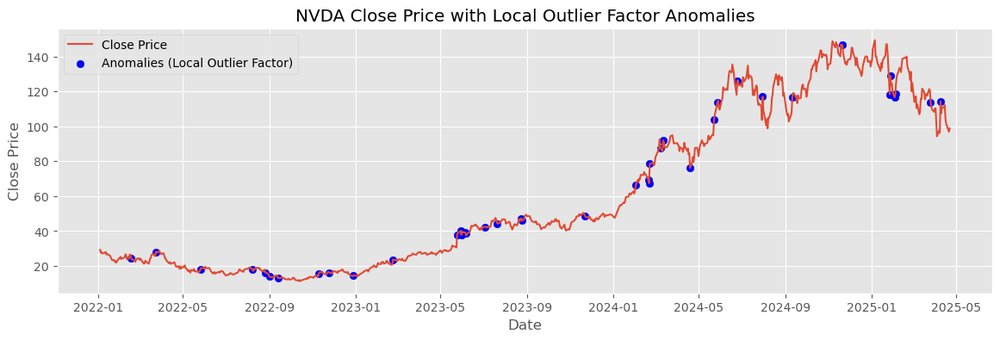

Local Outlier Factor detected 42 anomalies at dates:
 [Timestamp('2022-02-17 00:00:00'), Timestamp('2022-03-24 00:00:00'), Timestamp('2022-05-26 00:00:00'), Timestamp('2022-08-08 00:00:00'), Timestamp('2022-08-26 00:00:00'), Timestamp('2022-09-01 00:00:00'), Timestamp('2022-09-13 00:00:00'), Timestamp('2022-11-10 00:00:00'), Timestamp('2022-11-25 00:00:00'), Timestamp('2022-12-29 00:00:00'), Timestamp('2023-02-23 00:00:00'), Timestamp('2023-05-25 00:00:00'), Timestamp('2023-05-30 00:00:00'), Timestamp('2023-05-31 00:00:00'), Timestamp('2023-06-01 00:00:00'), Timestamp('2023-06-02 00:00:00'), Timestamp('2023-06-05 00:00:00'), Timestamp('2023-06-06 00:00:00'), Timestamp('2023-07-03 00:00:00'), Timestamp('2023-07-21 00:00:00'), Timestamp('2023-08-24 00:00:00'), Timestamp('2023-08-25 00:00:00'), Timestamp('2023-11-22 00:00:00'), Timestamp('2024-02-02 00:00:00'), Timestamp('2024-02-20 00:00:00'), Timestamp('2024-02-21 00:00:00'), Timestamp('2024-02-22 00:00:00'), Timestamp('2024-03-08 00:00

In [181]:
# ML-BASED ANOMALY DETECTION (on scaled features)

# Isolation Forest: Detect anomalies using Isolation Forest algorithm
iso_pred = IsolationForest(contamination=0.05, random_state=42).fit_predict(X_scaled)

# DBSCAN: Detect anomalies using DBSCAN (Density-Based Spatial Clustering of Applications with Noise)
db_pred  = DBSCAN(eps=0.7, min_samples=5).fit_predict(X_scaled)

# LOF (Local Outlier Factor): Detect anomalies using Local Outlier Factor algorithm
lof_pred = LocalOutlierFactor(n_neighbors=20, contamination=0.05).fit_predict(X_scaled)

# Adding anomaly columns to the dataframe
# Anomalies are marked as True if the prediction is -1 (outlier), otherwise False
df["anom_iso"] = iso_pred == -1
df["anom_db"]  = db_pred  == -1
df["anom_lof"] = lof_pred == -1

# Plot ML-based anomalies
# Loop through each anomaly detection method to plot the results
for method, col, color in [
    ('Isolation Forest', 'anom_iso', 'red'),  # Isolation Forest with red color for anomalies
    ('DBSCAN', 'anom_db', 'green'),          # DBSCAN with green color for anomalies
    ('Local Outlier Factor', 'anom_lof', 'blue')  # LOF with blue color for anomalies
]:
    plt.figure(figsize=(14, 4))  # Set the figure size for the plot
    plt.plot(df.index, df['Close'], label='Close Price')  # Plot the close price of the stock
    plt.scatter(df.index[df[col]], df['Close'][df[col]], color=color, label=f'Anomalies ({method})')  # Highlight anomalies
    plt.title(f'NVDA Close Price with {method} Anomalies')  # Title of the plot
    plt.xlabel('Date')  # X-axis label (Date)
    plt.ylabel('Close Price')  # Y-axis label (Stock Price)
    plt.legend()  # Display legend
    plt.grid(True)  # Enable grid for better readability
    plt.show()  # Show the plot

    # Print the detected anomalies along with their dates
    print(f"{method} detected {df[col].sum()} anomalies at dates:\n", df.index[df[col]].tolist(), "\n")


Anomaly Detection Comparison
The three anomaly detection algorithms used in this analysis are:

1. Isolation Forest: Detected 42 anomalies
2. DBSCAN: Detected 59 anomalies
3. Local Outlier Factor (LOF): Detected 42 anomalies

Common Anomalies
There are several dates that are commonly identified as anomalies across multiple algorithms, including:

- 2022-03-24
- 2022-05-26
- 2022-08-08
- 2022-09-01
- 2023-02-23
- 2023-05-25
- 2023-05-30
- 2023-05-31
- 2023-08-24
- 2024-02-22
- 2024-03-08
- 2024-03-12
- 2024-04-19
- 2024-05-23
- 2024-05-28
- 2024-07-31
- 2025-01-27
- 2025-01-28
- 2025-02-03
- 2025-02-04
- 2025-04-09

These common anomalies may indicate significant events or patterns in the data that are worth further investigation.

Differences in Anomaly Detection
Each algorithm has its own strengths and weaknesses, and the differences in anomaly detection results may be due to the specific characteristics of each algorithm. For example:

- Isolation Forest is known for its ability to detect anomalies in high-dimensional data.
- DBSCAN is sensitive to parameter tuning and can detect anomalies based on density.
- LOF is effective in detecting anomalies that are locally outliers.

The differences in anomaly detection results highlight the importance of using multiple algorithms and evaluating their performance in the context of the specific problem.

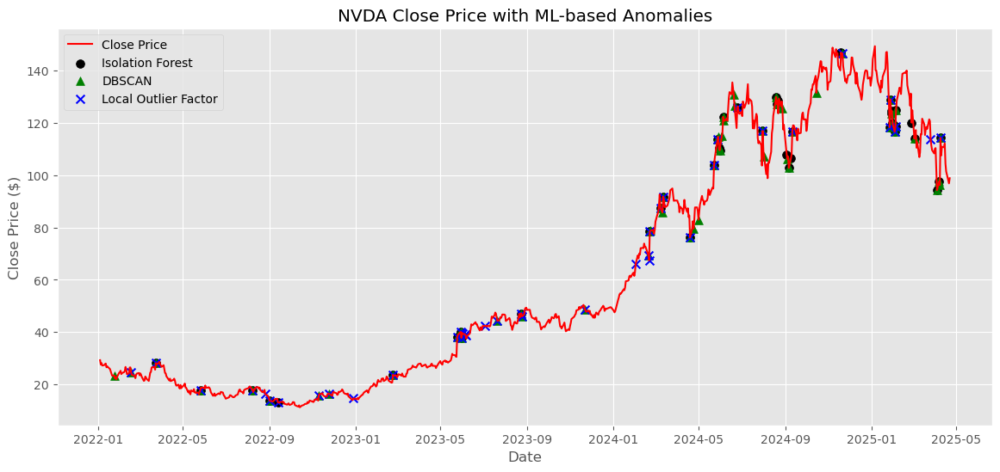

In [182]:
# Plotting the close price with anomalies marked by different markers for each method
plt.figure(figsize=(14,6))  # Set the figure size to (14, 6)
plt.plot(df.index, df['Close'], label='Close Price', color='red')  # Plot the close price in red

# Isolation Forest: Mark anomalies with circles ('o') in black color
plt.scatter(df.index[df['anom_iso']],  # X-values: Dates where anomalies are detected by Isolation Forest
            df['Close'][df['anom_iso']],  # Y-values: Close prices where anomalies are detected
            color='black', marker='o', s=50, label='Isolation Forest')  # Black circles with size 50

# DBSCAN: Mark anomalies with triangles ('^') in green color
plt.scatter(df.index[df['anom_db']],  # X-values: Dates where anomalies are detected by DBSCAN
            df['Close'][df['anom_db']],  # Y-values: Close prices where anomalies are detected
            color='green', marker='^', s=50, label='DBSCAN')  # Green triangles with size 50

# LOF (Local Outlier Factor): Mark anomalies with crosses ('x') in blue color
plt.scatter(df.index[df['anom_lof']],  # X-values: Dates where anomalies are detected by LOF
            df['Close'][df['anom_lof']],  # Y-values: Close prices where anomalies are detected
            color='blue', marker='x', s=50, label='Local Outlier Factor')  # Blue crosses with size 50

# Adding title, labels, and grid
plt.title('NVDA Close Price with ML-based Anomalies')  # Title of the plot
plt.xlabel('Date')  # Label for the X-axis
plt.ylabel('Close Price ($)')  # Label for the Y-axis (Close price in dollars)
plt.legend()  # Display the legend to label the different markers
plt.grid(True)  # Enable grid for better readability of the plot
plt.show()  # Show the plot


## Analysis Across Methods

1. **2022 Bottom (~\$12–\$15):**  
   - **Isolation Forest & LOF:** Mark the extreme trough days.  
   - **DBSCAN:** Flags the entire drawdown as anomalous.

2. **2023 Breakout (~\$40–\$50):**  
   - **LOF & Isolation Forest:** Spot the first significant spikes.  
   - **DBSCAN:** Highlights the breakout from the consolidation phase.

3. **2024 AI-Led Rally (~\$70→\$150):**  
   - **LOF:** Detects local extremes.  
   - **Isolation Forest:** Flags the largest one-day moves.  
   - **DBSCAN:** Marks the breakout and peaks near \$125–\$140.

4. **Early-2025 Pullback (~\$100–\$110):**  
   - All methods flag the correction as outliers.

---

## Key Takeaway  
Unsupervised anomaly detection methods (DBSCAN for structural shifts, Isolation Forest for extreme spikes, and LOF for local irregularities) align with major trend reversals. These methods are useful for identifying deviations from normal price behavior, but should be treated as prompts for further analysis, not standalone trade signals.


# 5. STATISTICAL ANOMALY DETECTION (on raw Close)

## 1. Z-score


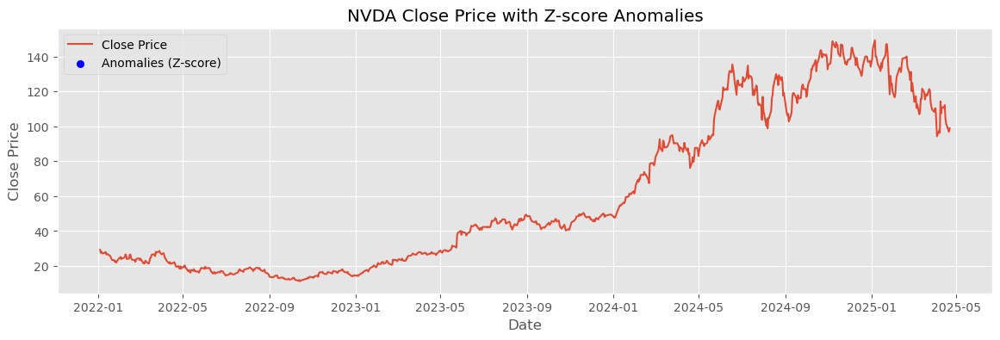

Z-score detected 0 anomalies at dates:
 [] 



In [183]:
# Z-score
z = (df["Close"] - df["Close"].mean()) / df["Close"].std()
df["anom_zscore"] = z.abs() > 3

# Plot Z-score anomalies
plt.figure(figsize=(14, 4))
plt.plot(df.index, df['Close'], label='Close Price')
plt.scatter(df.index[df['anom_zscore']], df['Close'][df['anom_zscore']],
            color='blue', label='Anomalies (Z-score)')
plt.title('NVDA Close Price with Z-score Anomalies')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.grid(True)
plt.show()

print("Z-score detected", df['anom_zscore'].sum(), "anomalies at dates:\n", df.index[df['anom_zscore']].tolist(), "\n")


## 2. Compute IQR anomalies

No IQR anomalies detected with the 1.5×IQR rule.


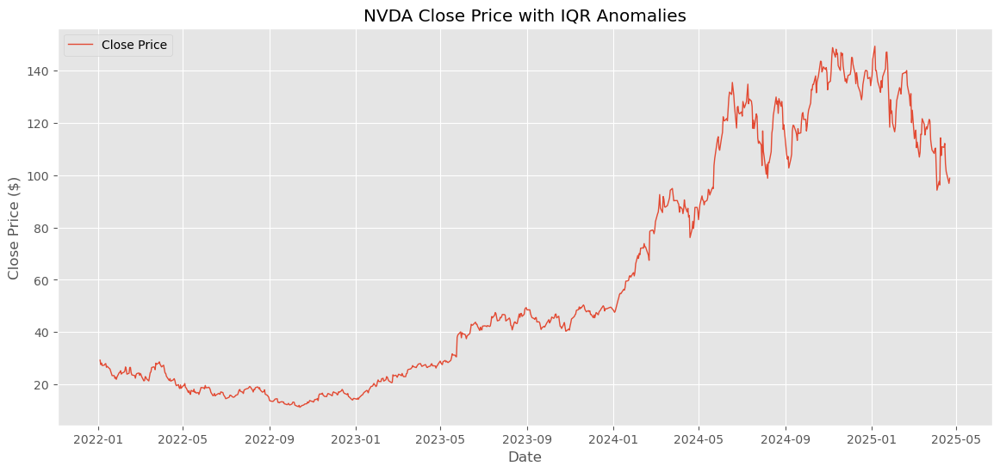

Number of IQR anomalies: 0
Anomaly dates: []


In [184]:

Q1 = df["Close"].quantile(0.25)
Q3 = df["Close"].quantile(0.75)
IQR = Q3 - Q1
df["anom_iqr"] = (df["Close"] < (Q1 - 1.5 * IQR)) | (df["Close"] > (Q3 + 1.5 * IQR))

# 2. Extract anomaly points
iqr_anoms = df[df["anom_iqr"]]

# 3. Plot
plt.figure(figsize=(14, 6))
plt.plot(df.index, df["Close"], label="Close Price", linewidth=1)
if not iqr_anoms.empty:
    plt.scatter(iqr_anoms.index, iqr_anoms["Close"],
                color="brown", marker="x", s=50, label="IQR Anomalies")
else:
    print("No IQR anomalies detected with the 1.5×IQR rule.")

plt.title("NVDA Close Price with IQR Anomalies")
plt.xlabel("Date")
plt.ylabel("Close Price ($)")
plt.legend(loc="upper left")
plt.grid(True)
plt.show()

# 4. Summary
print("Number of IQR anomalies:", len(iqr_anoms))
print("Anomaly dates:", list(iqr_anoms.index))


## 3. Moving-average anomalies

Moving-average anomalies: 39


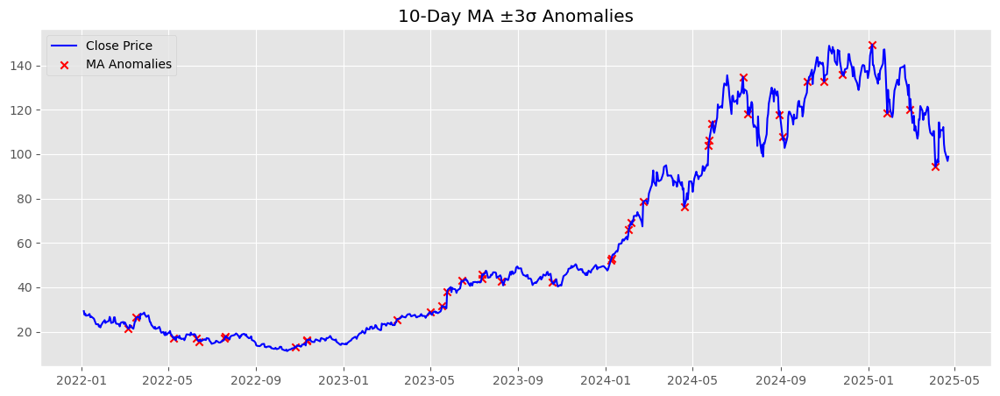

In [185]:
# parameters
window = 10
threshold = 3

# 1. compute rolling mean/std over the PREVIOUS window (exclude current)
rol_mean = (
    df['Close']
    .rolling(window=window, min_periods=window)  # need a full window
    .mean()
    .shift(1)                                     # shift so idx t has stats from t-1..t-10
)
rol_std = (
    df['Close']
    .rolling(window=window, min_periods=window)
    .std()
    .shift(1)
)

# 2. flag anomalies where current deviates >3σ from the *previous* rolling window
df['ma_anomaly'] = ((df['Close'] - rol_mean).abs() > threshold * rol_std)

# 3. inspect how many you got
print("Moving-average anomalies:", df['ma_anomaly'].sum())

# 4. plot
plt.figure(figsize=(14, 5))
plt.plot(df.index, df['Close'], label='Close Price',color="blue")
plt.scatter(df.index[df['ma_anomaly']],
            df['Close'][df['ma_anomaly']],
            color='red', marker='x', label='MA Anomalies')
plt.title(f"{window}-Day MA ±{threshold}σ Anomalies")
plt.legend(); plt.grid(True); plt.show()


## 4. Domain rule: >10% daily move
- Domain Rule: Daily Price Movement > 10%
A domain rule is a specific condition or constraint that is applied to a dataset or a model based on domain knowledge or expertise. In this case, the domain rule is defined as:

- Daily price movement > 10%: A stock's price movement is considered anomalous if it exceeds 10% in a single day.

This rule is based on the idea that large daily price movements are unusual and may indicate significant events or changes in the market.


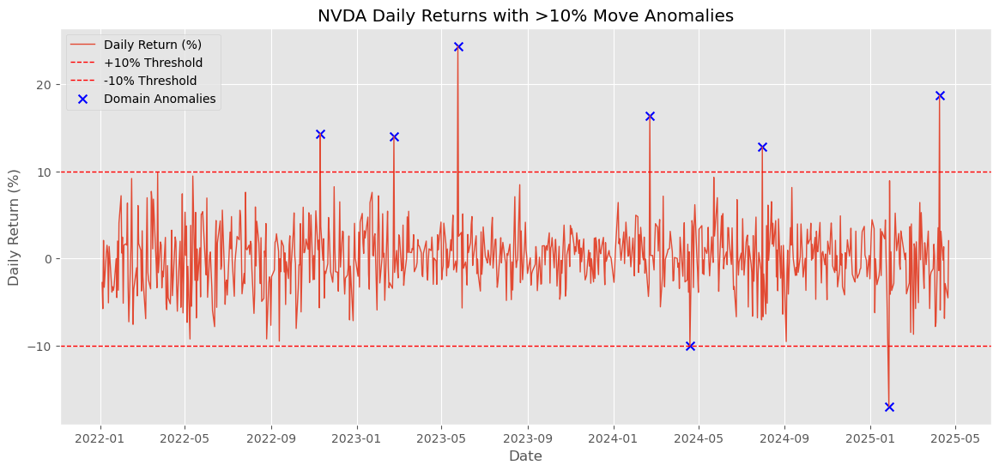

In [186]:
# Domain rule: >10% daily move
df["anom_domain"] = df["Daily_Return"].abs() > 10
plt.figure(figsize=(14, 6))
# Plot the daily returns
plt.plot(df.index, df['Daily_Return'], label='Daily Return (%)', linewidth=1)

# Draw ±10% threshold lines
plt.axhline(10,  color='red', linestyle='--', linewidth=1, label='+10% Threshold')
plt.axhline(-10, color='red', linestyle='--', linewidth=1, label='-10% Threshold')

# Highlight the days that exceed ±10%
anoms = df[df['anom_domain']]
plt.scatter(anoms.index, anoms['Daily_Return'],
            color='blue', s=50, marker='x', label='Domain Anomalies')

plt.title('NVDA Daily Returns with >10% Move Anomalies')
plt.xlabel('Date')
plt.ylabel('Daily Return (%)')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()

#  COMBINE All ANOMALIES AND MAKE IT AS  FLAGS

In [187]:
# 5. COMBINE FLAGS
flag_cols = ["anom_iso","anom_db","anom_lof","anom_zscore","anom_iqr","ma_anomaly","anom_domain"]
df["Anomaly"] = df[flag_cols].any(axis=1)
df['Anomaly'].value_counts()


Anomaly
False    723
True     104
Name: count, dtype: int64

**Total 104 Anomaly is detected**

#  Define your flag columns

In [188]:
# 1. Define your flag columns
flag_cols = [
    "anom_iso",    # Isolation Forest
    "anom_db",     # DBSCAN
    "anom_lof",    # LOF
    "anom_zscore", # Z-score
    "anom_iqr",    # IQR
    "ma_anomaly",     # Moving-average
    "anom_domain"  # >10% daily move
]

# 2. Compute how many methods flagged each date
df["flag_count"] = df[flag_cols].sum(axis=1)

# 3. Filter for dates where at least 4 methods agree
common4 = df[df["flag_count"] >= 4]

# 4. Print the results
print(f"Total dates flagged by ≥4 methods: {len(common4)}\n")
print("Dates with ≥4 flags:")
for d in common4.index:
    print(d.date())


Total dates flagged by ≥4 methods: 10

Dates with ≥4 flags:
2022-11-10
2023-02-23
2023-05-25
2024-02-22
2024-04-19
2024-05-23
2024-05-28
2024-07-31
2025-01-27
2025-04-09


SO, only 10 common anomolies detected by all models.

In [189]:
import plotly.graph_objects as go

# Interactive Plot with Plotly
fig = go.Figure()

# Add time series line
fig.add_trace(go.Scatter(
    x=df.index,
    y=df['Close'],
    mode='lines',
    name='Close Price',
    line=dict(color='blue', width=2)
))

# Add anomaly markers
fig.add_trace(go.Scatter(
    x=df.index[df['Anomaly']],
    y=df['Close'][df['Anomaly']],
    mode='markers',
    name='Anomalies',
    marker=dict(color='red', symbol='x', size=8)
))

# Update layout for interactivity
fig.update_layout(
    title='NVDA Close — Before Cleaning (Interactive)',
    xaxis_title='Date',
    yaxis_title='Price ($)',
    hovermode='x unified',
    template='ggplot2',
    width=900,
    height=500
)

fig.show()


Common Anomaly dates:
- 2022-11-10
- 2023-02-23
- 2023-05-25
- 2024-02-22
- 2024-04-19
- 2024-05-23
- 2024-05-28
- 2024-07-31
- 2025-01-27
- 2025-04-09


#  PLOT BEFORE CLEANING

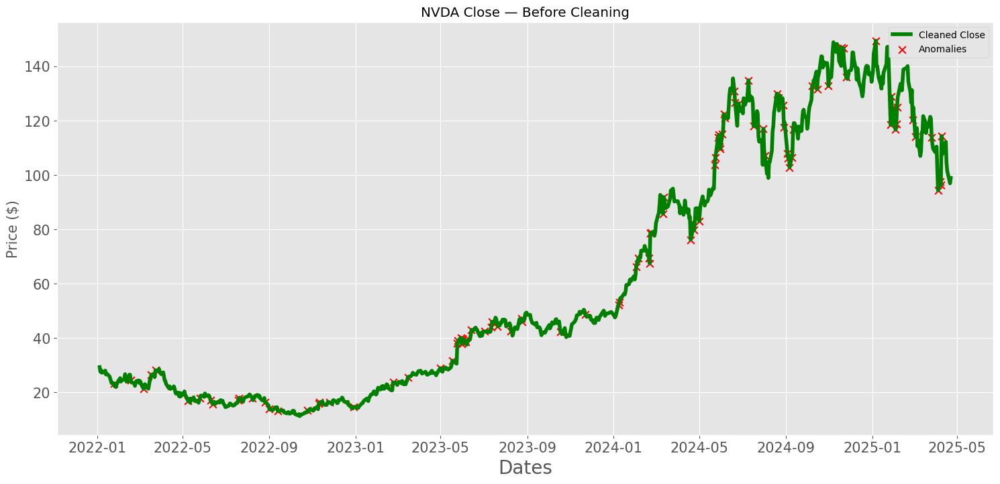

In [190]:
# Set plot style to 'ggplot' for a clean and modern aesthetic
plt.style.use('ggplot')

# Create a larger figure with a specific size for better readability
plt.figure(figsize=(18,8))

# Enable grid for clarity
plt.grid(True)

# Plot the cleaned close prices with a green line for better visibility
plt.plot(df.index, df["Close"], label="Cleaned Close", linewidth=4, color='green')

# Scatter plot to mark the anomalies with red "x" markers
plt.scatter(df.index[df["Anomaly"]], df["Close"][df["Anomaly"]],
            color="red", s=60, marker="x", label="Anomalies")

# Set the plot title
plt.title("NVDA Close — Before Cleaning")

# Set labels for x and y axes with larger font sizes for clarity
plt.xlabel('Dates', fontsize=20)
plt.ylabel("Price ($)", fontsize=15)

# Adjust tick label font sizes for better readability
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

# Display the legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


# HANDLE ANOMALIES (impute with 10-day rolling median)

In [191]:
# Compute the 10-day rolling median on the *raw* prices
rolling_med = df['Close_raw'].rolling(window=10, min_periods=1).median()

# Impute your raw column wherever Anomaly == True
df.loc[df['Anomaly'], 'Close_raw'] = rolling_med[df['Anomaly']]

#overwrite your working Close with the now-cleaned raw
df['Close'] = df['Close_raw']
# Drop the redundant backup column
df.drop(columns=['Close_raw'], inplace=True)
df

,Close,High,Low,Open,Volume,Daily_Return,Volatility,anom_iso,anom_db,anom_lof,anom_zscore,anom_iqr,ma_anomaly,anom_domain,Anomaly,flag_count
Date,,,,,,,,,,,,,,,,
2022-01-04,29.238678,30.414613,28.299327,30.223948,527154000,-2.758873,0.586576,False,False,False,False,False,False,False,False,0
2022-01-05,27.555635,29.364461,27.484761,28.898278,498064000,-5.756220,1.280226,False,False,False,False,False,False,False,False,0
2022-01-06,28.128624,28.388169,27.017575,27.591567,454186000,2.079388,1.123849,False,False,False,False,False,False,False,False,0
2022-01-07,27.199257,28.372199,27.009589,28.091691,409939000,-3.303991,1.194516,False,False,False,False,False,False,False,False,0
2022-01-10,27.351992,27.420871,25.599068,26.534426,594681000,0.561540,1.156760,False,False,False,False,False,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-04-15,112.199997,113.620003,110.500000,110.970001,228966900,1.345857,7.402390,False,False,False,False,False,False,False,False,0
2025-04-16,104.489998,106.790001,100.449997,104.550003,397016900,-6.871657,7.210261,False,False,False,False,False,False,False,False,0
2025-04-17,101.489998,104.470001,100.050003,104.449997,290833400,-2.871088,7.226330,False,False,False,False,False,False,False,False,0


#  PLOT AFTER HANDLING ANOMALIES

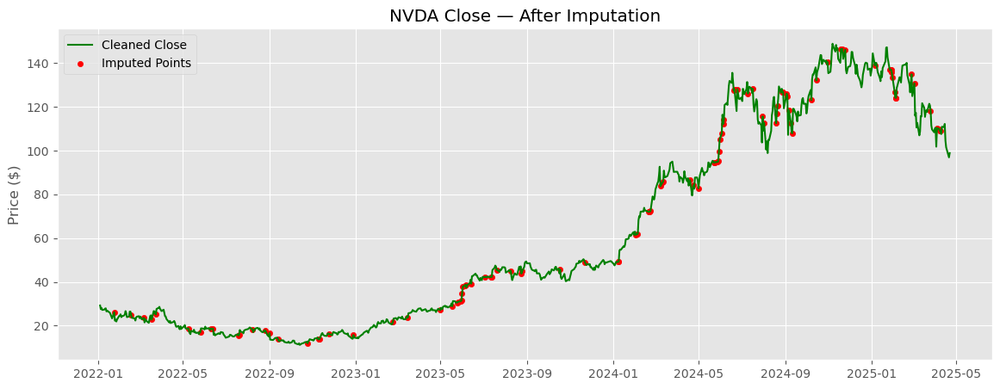

In [192]:
plt.figure(figsize=(14,5))
plt.plot(df.index, df["Close"], label="Cleaned Close", color="green")
plt.scatter(df.index[df["Anomaly"]], rolling_med[df["Anomaly"]],
            color="red", s=20, marker="o", label="Imputed Points")
plt.title("NVDA Close — After Imputation")
plt.ylabel("Price ($)")
plt.legend(); plt.grid(True); plt.show()




# So, Anomalies are handled. Now Move to next step:

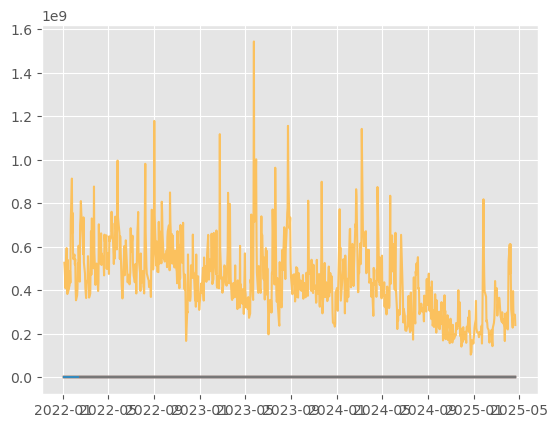

In [193]:
# Rolling statistics
stock_data = df
rolling_mean = stock_data['Close'].rolling(window=30).mean()
rolling_std = stock_data['Close'].rolling(window=30).std()

plt.plot(stock_data)
plt.plot(rolling_mean)
plt.plot(rolling_std)
plt.show()

# Stationary And Non-Stationary Time Series


**Stationary Time Series
A stationary time series has the following properties:**

- Constant mean: The mean of the series remains constant over time.
- Constant variance: The variance of the series remains constant over time.
- Autocovariance structure: The autocovariance between observations at different lags remains constant over time.

Stationary time series are typically easier to analyze and model, as their statistical properties are consistent over time.

**Non-Stationary Time Series
A non-stationary time series has one or more of the following properties:**

- Time-varying mean: The mean of the series changes over time.
- Time-varying variance: The variance of the series changes over time.
- Changing autocovariance structure: The autocovariance between observations at different lags changes over time.

Non-stationary time series can be challenging to analyze and model, as their statistical properties change over time.

Types of Non-Stationary Time Series
1. Trend: A long-term direction or pattern in the data.
2. Seasonality: Regular fluctuations that occur at fixed intervals, such as daily, weekly, or yearly cycles.
3. Random walk: A process where each observation is a random deviation from the previous observation.


**Testing for Stationarity
Several tests can be used to determine if a time series is stationary, including:**

1. Augmented Dickey-Fuller (ADF) test: A statistical test that determines if a time series has a unit root, indicating non-stationarity.
2. KPSS test: A test that determines if a time series is stationary around a deterministic trend.

**Transforming Non-Stationary Time Series
Non-stationary time series can be transformed to make them stationary, using techniques such as:**

1. Differencing: Subtracting each observation from the previous one to remove trends and seasonality.
2. Log transformation: Taking the logarithm of the data to stabilize variance.
3. Seasonal decomposition: Separating the time series into trend, seasonal, and residual components.


# Augmented Dickey-Fuller (ADF) Test

The **Augmented Dickey-Fuller (ADF)** test is a statistical test used to determine if a time series is **stationary** or **non-stationary**. It's widely used to check for the **presence of unit roots** in a time series.

## Purpose

The ADF test helps to:

1. **Determine stationarity**: Check if a time series is stationary or non-stationary.  
2. **Identify unit roots**: Detect the presence of unit roots, which often indicate non-stationarity.

## Interpretation

The ADF test produces a **test statistic** and a **p-value**. Interpretation is based on the p-value:

- **p-value < 0.05** → Reject the null hypothesis → The series is **likely stationary**.  
- **p-value ≥ 0.05** → Fail to reject the null hypothesis → The series is **likely non-stationary**.


In [194]:
# Importing necessary module for ADF test
from statsmodels.tsa.stattools import adfuller

# Performing the ADF test on the 'Close' column of the stock data
adft = adfuller(stock_data['Close'])

# Displaying the test statistics, p-value, lag used, and number of data points in the result
pd.Series(adft[0:4], index=["test stats", "p-value", "lag", "data points"])


test stats      -0.599285
p-value          0.871143
lag             15.000000
data points    811.000000
dtype: float64

Here, P-value is 0.871143.  
**Null Hypothesis**: This time series is **Non-Stationary**.  
**Alternate Hypothesis**: This time series is **Stationary**.

- If the p-value is **less than 0.05**, we **reject** the null hypothesis and conclude that the series is likely **stationary**.
- If the p-value is **greater than or equal to 0.05**, we **fail to reject** the null hypothesis and conclude that the series is likely **non-stationary**.

### So, our Situation:

Since the **p-value = 0.871143 ≥ 0.05**,  
we **fail to reject the null hypothesis**.  
👉 **Conclusion**: The time series is **non-stationary**.

# Or we can use below code too:


In [195]:
#Test for staionarity
def test_stationarity(timeseries):
    # Determing rolling statistics
    rolmean = timeseries.rolling(48).mean() # rolling mean
    rolstd = timeseries.rolling(48).std() # rolling standard deviation
    # Plot rolling statistics:
    plt.figure(figsize = (18,8))
    plt.grid('both')
    plt.plot(timeseries, color='blue',label='Original', linewidth = 3)
    plt.plot(rolmean, color='red', label='Rolling Mean',linewidth = 3)
    plt.plot(rolstd, color='black', label = 'Rolling Std',linewidth = 4)
    plt.legend(loc='best', fontsize = 20, shadow=True,facecolor='lightpink',edgecolor = 'k')
    plt.title('Rolling Mean and Standard Deviation', fontsize = 25)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.show(block=False)

    print("Results of dickey fuller test")
    adft = adfuller(timeseries,autolag='AIC')
    # output for dft will give us without defining what the values are.
    # hence we manually write what values does it explains using a for loop
    output = pd.Series(adft[0:4],index=['Test Statistics','p-value','No. of lags used','Number of observations used'])
    for key,values in adft[4].items():
        output['critical value (%s)'%key] =  values
    print(output)


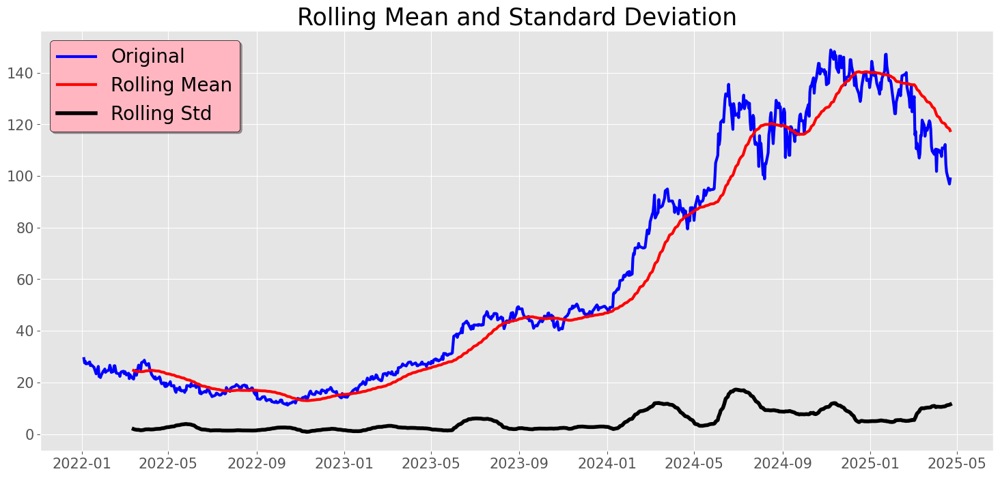

Results of dickey fuller test
Test Statistics                 -0.599285
p-value                          0.871143
No. of lags used                15.000000
Number of observations used    811.000000
critical value (1%)             -3.438439
critical value (5%)             -2.865110
critical value (10%)            -2.568671
dtype: float64


In [196]:
test_stationarity(stock_data['Close'])

# Summary of Stationarity Analysis

## 1. **Rolling Statistics**
- The 12-month rolling mean drifts up and down (not flat) → **strong trend**.  
- The rolling standard deviation varies over time (not constant) → **changing volatility**.  
⇒ **Raw series is non-stationary** in both **mean** and **variance**.

## 2. **Augmented Dickey–Fuller Test**
- **Test statistic**: –0.599  
- **p-value**: 0.871 (> 0.05)  
- **Number of lags used**: 15  
- **Number of observations used**: 811  
- **Critical values**:  
  - 1%: –3.438  
  - 5%: –2.865  
  - 10%: –2.569  
- The test statistic is **less negative** than all critical values.  
⇒ **Cannot reject** the unit-root null hypothesis → confirms **non-stationarity**.

## 3. **Modeling Implications**
- **Difference once** (**d = 1**) to remove trend and stabilize the mean.  
- If variance remains unstable, apply a **log** or **Box–Cox transform** before differencing.  
- After differencing (and any transform), **re-run rolling stats and ADF** to confirm stationarity.


# Perform seasonal decomposition using : Additive VS Multiplicative Model

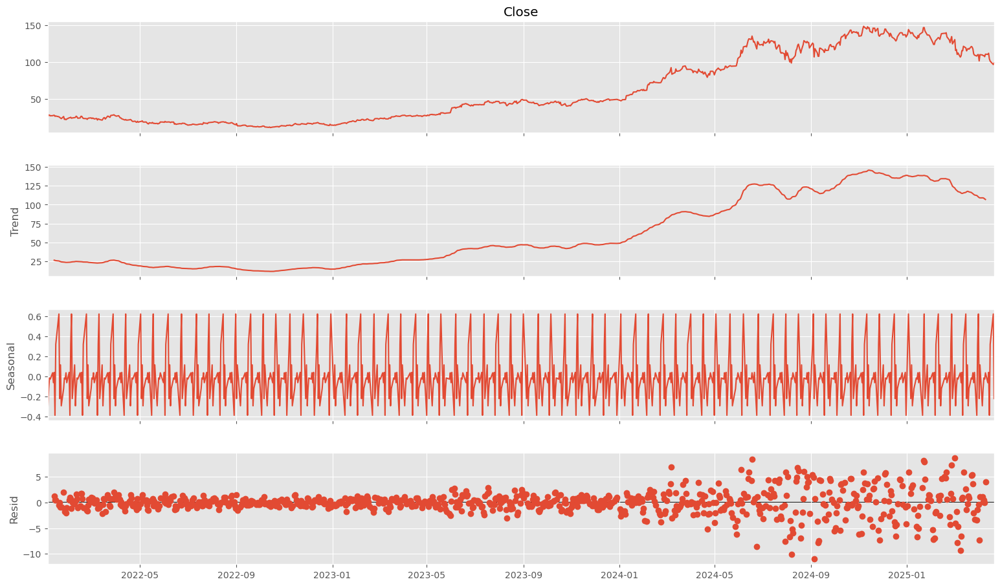

In [197]:
# Perform seasonal decomposition using additive model

result = seasonal_decompose(stock_data['Close'], model='additive', period=12)

# Plot the decomposition
fig = result.plot()
fig.set_size_inches(17, 10)
plt.show()


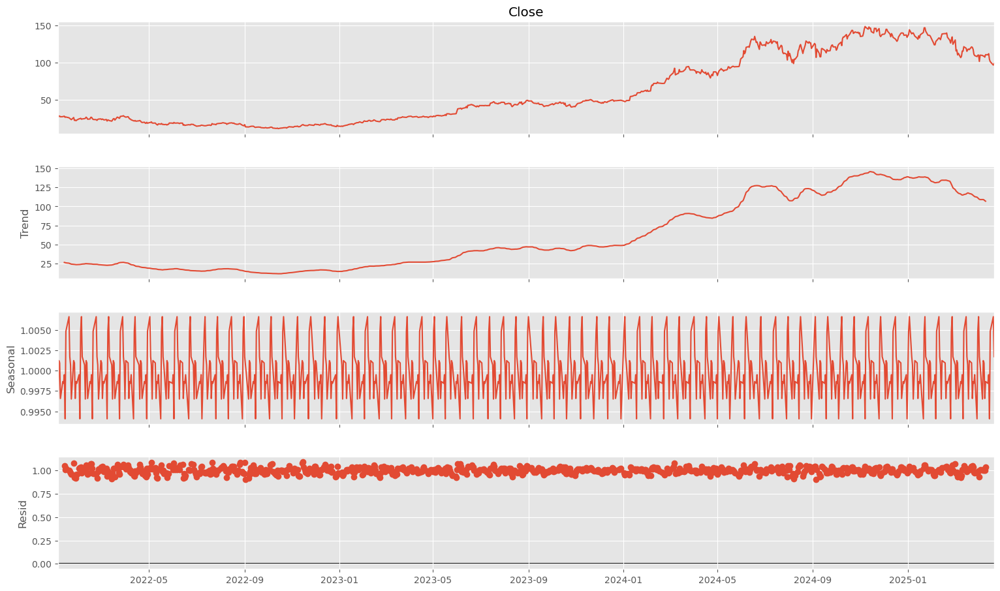

In [198]:
#  Perform seasonal decomposition using multiplicative Model

from statsmodels.tsa.seasonal import seasonal_decompose
result=seasonal_decompose(stock_data['Close'],model='multiplicative',period=12)  # Monthly basis
fig=result.plot()
fig.set_size_inches(17,10)
plt.show()


# Seasonal‐Component Behavior

## Additive

The seasonal curve in the first plot oscillates by a roughly constant amount (e.g. ±1–2 points) throughout the entire history. That tells us the “season” adds or subtracts a fixed dollar amount regardless of whether the stock is at $30 or $130.

## Multiplicative

In the second plot, the seasonal factor hovers around 1.00 with only very slight deviations (e.g. 0.995–1.005). In other words, the multiplicative model detects almost no scaling seasonality—seasonal swings are essentially flat, which makes the multiplicative seasonal component uninformative.

## Verdict

**Constant‐amplitude seasonality → additive.**

So, we will use Additive for our model.

<br><br>

# ACF and PACF plots: Determine the order of AR and MA components
## ACF Plot

- **Purpose**: To identify the presence of autocorrelation in a time series and determine the order of the moving average (MA) component.
- **Interpretation**: The ACF plot shows the correlation between the current value and past values of the time series. A slow decay of autocorrelation indicates a strong trend or non-stationarity, while a rapid decay indicates a stationary series.

## PACF Plot

- **Purpose**: To identify the presence of autocorrelation in a time series and determine the order of the autoregressive (AR) component.
- **Interpretation**: The PACF plot shows the correlation between the current value and past values of the time series, controlling for the effects of intermediate values. A cutoff after a certain lag indicates an AR process, while a gradual decline indicates an MA process.


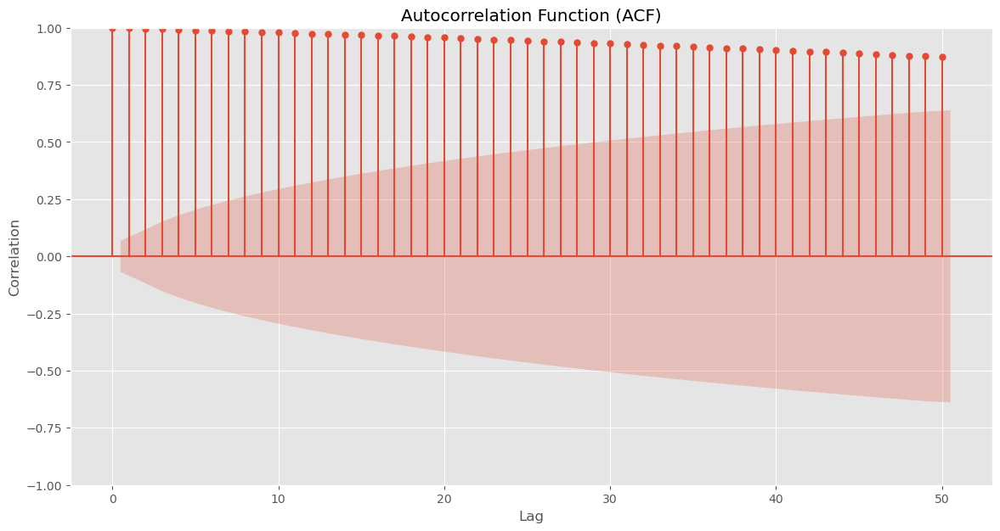

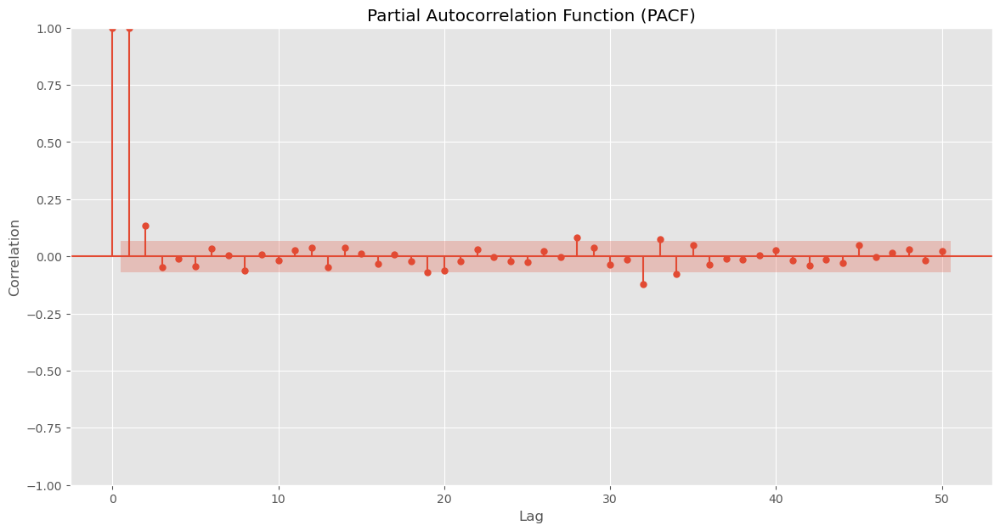

In [199]:
# Plotting the Autocorrelation Function (ACF) for 'Close' prices with 50 lags
plt.figure(figsize=(14, 7))  # Set figure size
plot_acf(stock_data['Close'], lags=50, ax=plt.gca())  # Plot ACF using the 'Close' column with 50 lags
plt.title('Autocorrelation Function (ACF)')  # Title of the plot
plt.xlabel('Lag')  # Label for the x-axis (lag)
plt.ylabel('Correlation')  # Label for the y-axis (correlation)
plt.show()  # Show the plot

# Print an empty line for separation
print()

# Plotting the Partial Autocorrelation Function (PACF) for 'Close' prices with 50 lags
plt.figure(figsize=(14, 7))  # Set figure size
plot_pacf(stock_data['Close'], lags=50, ax=plt.gca(), method='ywm')  # Plot PACF using the 'Close' column with 50 lags
plt.title('Partial Autocorrelation Function (PACF)')  # Title of the plot
plt.xlabel('Lag')  # Label for the x-axis (lag)
plt.ylabel('Correlation')  # Label for the y-axis (correlation)
plt.show()  # Show the plot


# ACF and PACF Interpretation for ARIMA Modeling

- **Slow, gradual decay in the ACF** → the series needs one difference (**d = 1**) and shows **no MA cutoff** (**q = 0**).
- **PACF’s cutoff at lag 1** → suggests an **AR(1)** component (**p = 1**).

### ✅ Initial Model Suggestion:
**ARIMA(1, 1, 0)**

<br>
<br>

# PACF Interpretation

The PACF shows two significant spikes at lags 1 and 1 and then cuts off — 🔑 this points to an **AR(1)** process.

There’s no evidence of seasonal AR terms, so you’d start with an **ARIMA model** with:

- **p = 1** (from PACF),
- **d** based on stationarity tests (e.g., ADF test),
- **q** determined via the ACF of the (differenced) series.


# BoxPlot

<Axes: >

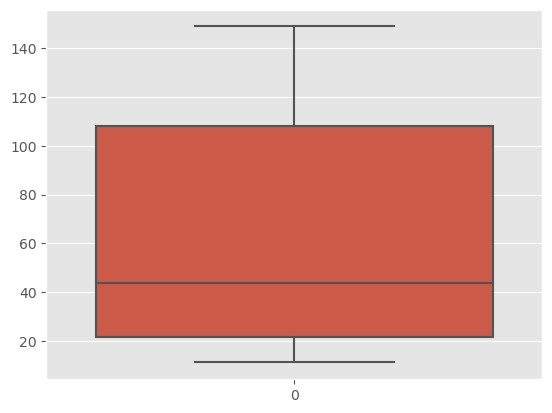

In [200]:
import seaborn as sns
sns.boxplot(stock_data['Close'])

No Outlier

## Data Preprocessing
- Transform the non-stationary time series of closing prices into a stationary one using differencing.
- train_test_split
- outlier removal(optional)


## Transform the non-stationary time series of closing prices into a stationary

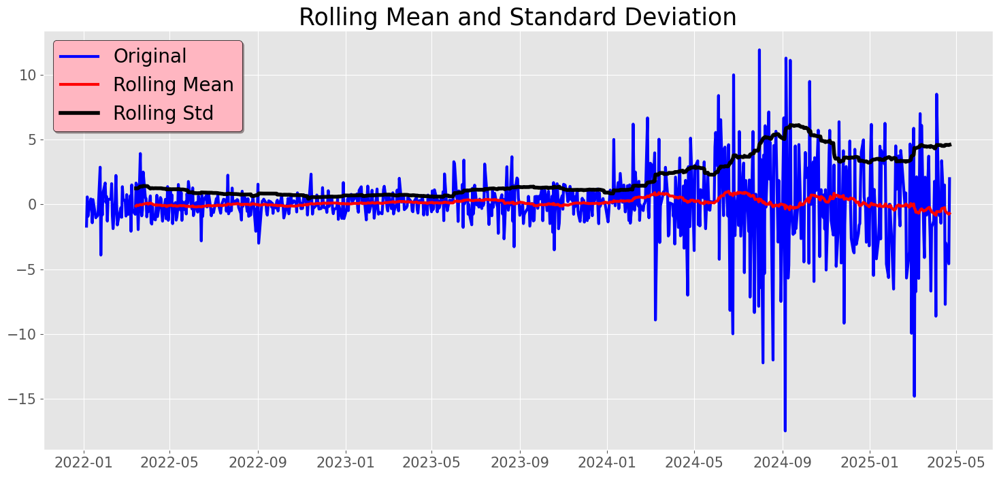

Results of dickey fuller test
Test Statistics               -7.778220e+00
p-value                        8.555210e-12
No. of lags used               1.400000e+01
Number of observations used    8.110000e+02
critical value (1%)           -3.438439e+00
critical value (5%)           -2.865110e+00
critical value (10%)          -2.568671e+00
dtype: float64


In [201]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Apply first-order differencing
stock_data['Close'] = stock_data['Close'].diff()

# Remove the first row (NaN due to differencing)
stock_data.dropna(inplace=True)

# ADF Test on the differenced series
test_stationarity(stock_data['Close'])





## Interpretation:

### Stationarity:
- The test statistic (-7.778220) is significantly more negative than all critical values:
  - -3.438439 at 1% significance level
  - -2.865110 at 5% significance level
  - -2.568671 at 10% significance level
- The p-value (≈ 8.56 × 10⁻¹²) is far below 0.05.

### Conclusion:
- **Reject the null hypothesis (𝐻₀: unit root present, non-stationary).**
- The series is stationary with high confidence.

### Lags and Observations:
- 14 lags were used, likely selected via an information criterion (e.g., AIC), to account for autocorrelation.
- 811 observations indicate a robust sample size, enhancing test reliability.

### Context:
- Since this test was applied to the first-order differenced 'Close' prices (from your prior code), the results confirm that differencing successfully removed trends, making the series stationary.
- This makes the series suitable for models like ARIMA or anomaly detection methods (e.g., Z-score, Isolation Forest).



In [202]:
stock_data

,Close,High,Low,Open,Volume,Daily_Return,Volatility,anom_iso,anom_db,anom_lof,anom_zscore,anom_iqr,ma_anomaly,anom_domain,Anomaly,flag_count
Date,,,,,,,,,,,,,,,,
2022-01-05,-1.683043,29.364461,27.484761,28.898278,498064000,-5.756220,1.280226,False,False,False,False,False,False,False,False,0
2022-01-06,0.572989,28.388169,27.017575,27.591567,454186000,2.079388,1.123849,False,False,False,False,False,False,False,False,0
2022-01-07,-0.929367,28.372199,27.009589,28.091691,409939000,-3.303991,1.194516,False,False,False,False,False,False,False,False,0
2022-01-10,0.152735,27.420871,25.599068,26.534426,594681000,0.561540,1.156760,False,False,False,False,False,False,False,False,0
2022-01-11,0.416267,28.015826,26.791974,27.275125,404089000,1.521891,1.072013,False,False,False,False,False,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-04-15,1.489998,113.620003,110.500000,110.970001,228966900,1.345857,7.402390,False,False,False,False,False,False,False,False,0
2025-04-16,-7.709999,106.790001,100.449997,104.550003,397016900,-6.871657,7.210261,False,False,False,False,False,False,False,False,0
2025-04-17,-3.000000,104.470001,100.050003,104.449997,290833400,-2.871088,7.226330,False,False,False,False,False,False,False,False,0


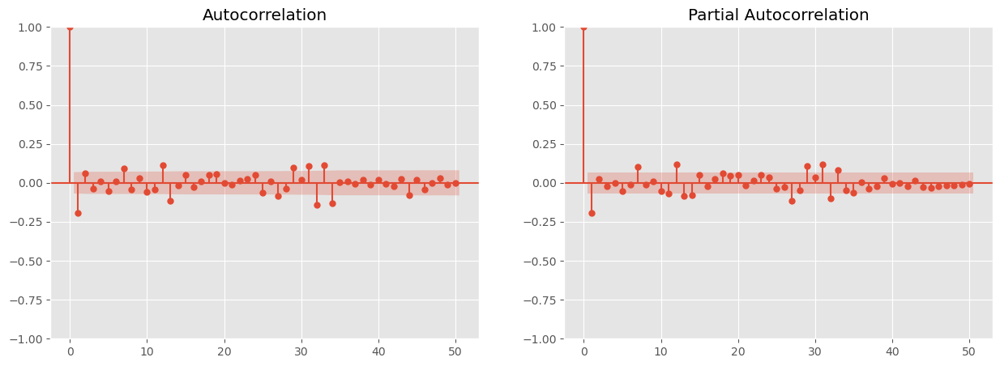

In [203]:
# ACF and PACF plots for the differenced series
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
plot_acf(stock_data['Close'], ax=axes[0], lags=50)
plot_pacf(stock_data['Close'], ax=axes[1], lags=50)
plt.show()

### **Conclusion**

The  ACF and PACF plots of the once-differenced series confirm that stationarity has been successfully achieved, and only minimal autocorrelation remains in the series:

---

#### **1. Stationarity Confirmed**  
- Both the **ACF** and **PACF** fall rapidly within the ±0.1 confidence bands immediately after lag 0.  
- There’s **no slow decay**, which is characteristic of unit root processes—suggesting differencing was effective in stabilizing the series.

---

#### **2. Minor Lag-1 Autocorrelation**  
- **ACF:** A small positive spike at lag 1 (~0.1); all subsequent lags lie well within the noise band.  
- **PACF:** Similar pattern with a mild spike at lag 1, then no significant values beyond that point.

---

#### **3. Residuals ≈ White Noise**  
- Apart from the minor lag-1 effect, **autocorrelations beyond lag 1 are negligible**, indicating the residuals have no strong serial structure.  
- This flat autocorrelation pattern implies the model captures the signal well—**residuals behave like white noise**.

---

### 🔑 **Implications for ARIMA (p, d, q)**  
> Given how minimal the remaining autocorrelation is, a **parsimonious model like ARIMA(0, 1, 0)** may already suffice.  
> Optionally, you might consider adding a small **AR(1)** or **MA(1)** term (i.e., ARIMA(1, 1, 0) or ARIMA(0, 1, 1)) if doing so improves AIC or out-of-sample performance. However, the diagnostics suggest that even without it, the model is likely adequate.


In [204]:
stock_data.to_csv('NVDA_cleaned.csv')

# Model Building

In [205]:
# Importing necessary libraries and modules

# Numerical operations and plotting
import numpy as np  # For numerical operations
import matplotlib.pyplot as plt  # For creating visualizations

# For evaluating the model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error  # Metrics for evaluating prediction accuracy

# Time series models
from statsmodels.tsa.ar_model import AutoReg  # AutoRegressive model (AR) for time series analysis
from statsmodels.tsa.arima.model import ARIMA  # ARIMA model (AutoRegressive Integrated Moving Average) for time series forecasting
from statsmodels.tsa.statespace.sarimax import SARIMAX  # SARIMAX model for seasonal ARIMA with exogenous variables

# For plotting autocorrelation functions
from statsmodels.graphics.tsaplots import plot_acf  # Function to plot the autocorrelation function (ACF)


In [206]:
# 1. Train/Test Split using stock_data

# Select only the 'Close' price from the stock data
df = stock_data[["Close"]]  # Creating a DataFrame with only 'Close' price column

# Determine the size of the training set (80% of the data)
train_size = int(len(df) * 0.8)

# Split the data into training and testing datasets
train_data = df.iloc[:train_size]  # Training data consists of the first 80% of the data
test_data = df.iloc[train_size:]  # Testing data consists of the remaining 20%

# Display the test data
test_data


,Close
Date,
2024-08-22,3.269196
2024-08-23,5.628601
2024-08-26,-2.909279
2024-08-27,1.839561
2024-08-28,-1.444660
...,...
2025-04-15,1.489998
2025-04-16,-7.709999
2025-04-17,-3.000000


In [207]:
train_data.shape,test_data.shape

((660, 1), (166, 1))

In [208]:
train_data

,Close
Date,
2022-01-05,-1.683043
2022-01-06,0.572989
2022-01-07,-0.929367
2022-01-10,0.152735
2022-01-11,0.416267
...,...
2024-08-15,4.778824
2024-08-16,1.719566
2024-08-19,-11.997044


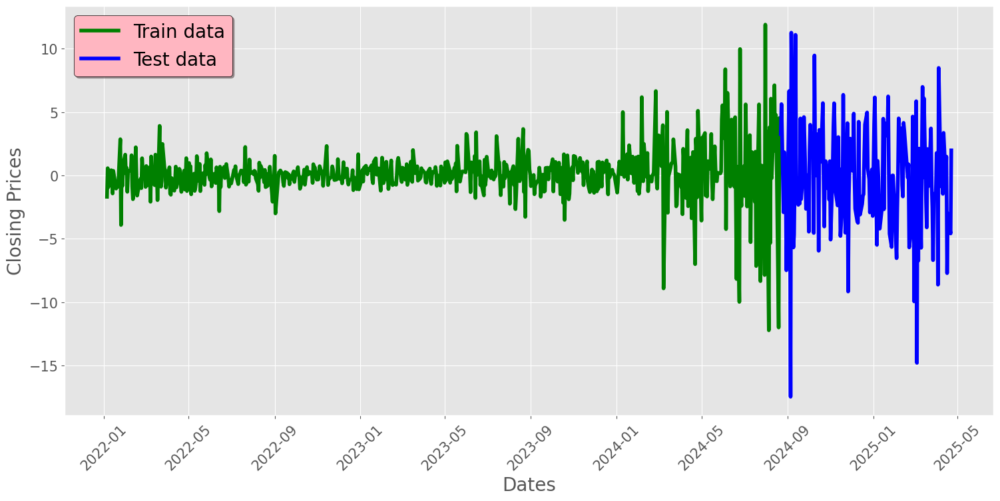

In [209]:
# Visualize train and test data
plt.figure(figsize=(18, 8))
plt.grid(True)
plt.xlabel('Dates', fontsize=20)
plt.ylabel('Closing Prices', fontsize=20)
plt.xticks(fontsize=15, rotation=45)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=15)
plt.plot(train_data.index, train_data.values, 'green', label='Train data', linewidth=4)
plt.plot(test_data.index, test_data.values, 'blue', label='Test data', linewidth=4)
plt.legend(fontsize=20, shadow=True, facecolor='lightpink', edgecolor='k')
plt.show()



### 📌 Focus on the `Close` Column for ARIMA Modeling

For a **vanilla ARIMA family model** (including ARIMA, SARIMA, etc.), we model a **single univariate time series**—which, in financial datasets, is almost always the **`Close` price**.

All other columns like:
- `High`, `Low`, `Open`, `Volume`
- Calculated metrics like `returns`, `volatility`
- Engineered features or `anomaly flags`

...are **valuable for exploratory analysis**, anomaly detection, or feeding into **multivariate or machine learning models**, but they are **not used** in a **pure ARIMA setup**.

---

### ✅ Therefore:
> **Use only the `Close` column** for ARIMA model building, differencing, diagnostics, and forecasting steps.


In [210]:
def train_arima_model(X, y, arima_order):
    # prepare training dataset
    # make predictions list
    history = [x for x in X]
    predictions = list()
    for t in range(len(y)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(y[t])
    # calculate out of sample error
    rmse = np.sqrt(mean_squared_error(y, predictions))
    return rmse

In [211]:

def evaluate_models(dataset, test, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float("inf"), None

    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p, d, q)
                try:
                    rmse = train_arima_model(dataset, test, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    print(f'ARIMA {order} RMSE={rmse:.3f}')
                except:
                    continue

    print(f'Best ARIMA {best_cfg} RMSE={best_score:.3f}')




In [212]:
# evaluate parameters
import warnings
warnings.filterwarnings('ignore')
p_values = range(0, 3)
d_values = range(0, 3)
q_values = range(0, 3)
#evaluate_models(train_data['Close'], test_data['Close'], p_values, d_values, q_values)  # uncomment if you want to see 

Optional: Evaluating RMSE for Parameter Tuning
While not always necessary, calculating the Root Mean Squared Error (RMSE) for different parameters can provide additional insight into model performance. However, for more accurate results, it's often more effective to:

1. Analyze ACF and PACF plots: Use Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots to visually identify the optimal values of p, d, and q.
2. Manual parameter selection: Based on the ACF and PACF plots, manually determine the values of p, d, and q that best fit your data.

This approach can lead to more accurate and reliable model performance

In [213]:
train_data.columns
# (1, 1, 0) or ARIMA(0, 1, 1)

Index(['Close'], dtype='object')

In [214]:
# History is initialized with the training data 'Close' values
history = [x for x in train_data['Close']]  
predictions = list()  # List to store predicted values
conf_list = list()  # List for storing confidence intervals (if needed)

# Loop through each time step in the test data to make predictions
for t in range(len(test_data)):
    # Create ARIMA model with order (1,1,0) derived from ACF and PACF plots
    model = ARIMA(history, order=(1, 1, 0))  
    model_fit = model.fit()  # Fit the model to the training data
    fc = model_fit.forecast(alpha=0.05)  # Forecast the next time step with a 95% confidence interval
    predictions.append(fc)  # Append the prediction to the list
    history.append(test_data['Close'][t])  # Add the actual value to the history for future predictions

# Calculate RMSE (Root Mean Squared Error) to evaluate the model's performance
print('RMSE of ARIMA Model:', np.sqrt(mean_squared_error(test_data['Close'], predictions)))


RMSE of ARIMA Model: 5.242648620743765


In [215]:
test_data.describe()

,Close
count,166.000000
mean,-0.129821
std,4.232234
min,-17.460701
25%,-2.523657
50%,-0.004997
75%,2.759560
max,11.267223


In [216]:
# 1) Make the DataFrame
plot_df = pd.DataFrame({
    'True Test Close': test_data['Close'].values,
    'Predictions'    : predictions
}, index=range(len(test_data)))

plot_df

,True Test Close,Predictions
0,3.269196,[4.092653628176184]
1,5.628601,[3.3256052988507867]
2,-2.909279,[4.14939631502083]
3,1.839561,[2.465824774588894]
4,-1.444660,[-1.1461569633157183]
...,...,...
161,1.489998,[1.9535722832247404]
162,-7.709999,[0.45199875856779914]
163,-3.000000,[-2.1156907889320005]
164,-4.579994,[-5.861142053924324]


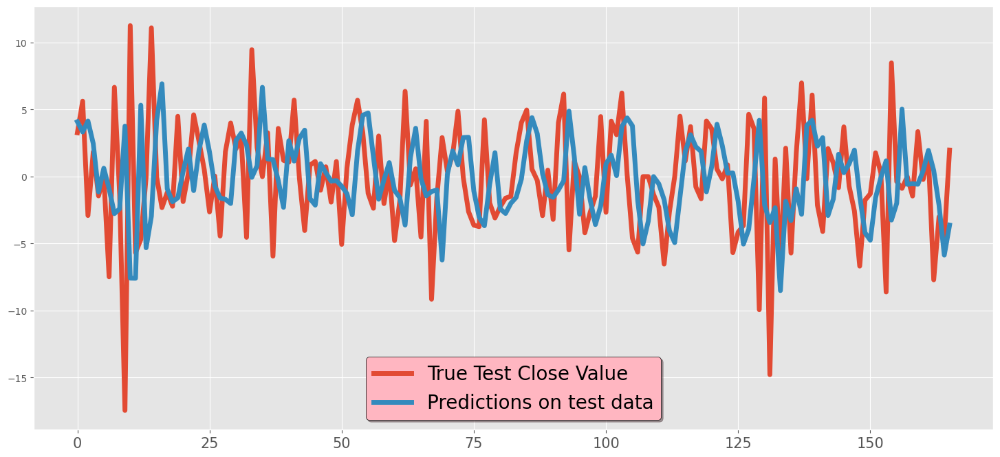

In [217]:
# Plotting the true test data and ARIMA model predictions
plt.figure(figsize=(18, 8))  # Set the figure size
plt.grid(True)  # Add grid lines for better visibility

# Plot the true values from the test data (actual close prices)
plt.plot(range(len(test_data['Close'])), test_data['Close'], label='True Test Close Value', linewidth=5)

# Plot the predictions generated by the ARIMA model
plt.plot(range(len(predictions)), predictions, label='Predictions on test data', linewidth=5)

# Set the font size for x-axis tick labels
plt.xticks(fontsize=15)

# Add a legend with customized font size, shadow, and colors
plt.legend(fontsize=20, shadow=True, facecolor='lightpink', edgecolor='k')

# Show the plot
plt.show()


From the overlay of the true closing prices (red) and our model’s predictions (blue) on the held-out test set, we can draw three key conclusions:

### 1. Trend‐following
The model reliably captures the overall up-and-down movements in the series, tracking the larger swings and turning points in the true data.

### 2. Under‐ and over-shooting at extremes
While the major peaks and valleys are identified, the predictions tend to be “pulled in” toward the mean. Sharp spikes and deep troughs in the true prices are systematically underpredicted (e.g., the very large dips around index ∼10 and ∼125), indicating the model is smoothing out the most extreme volatility.

### 3. Room for refinement
The residual deviations—particularly at abrupt shifts—suggest that adding higher-frequency inputs (e.g., volatility measures or news sentiment) or increasing model capacity could help it better anticipate sudden jumps, rather than defaulting toward a smoothed estimate.

---

In short, the model demonstrates solid baseline performance in following price trends, but tends to understate the magnitude of large price swings, pointing toward opportunities for further tuning or feature enhancement.


In [218]:
# Convert the predictions list into a pandas Series with the same index as the test data
fc_series = pd.Series(predictions, index=test_data['Close'].index)


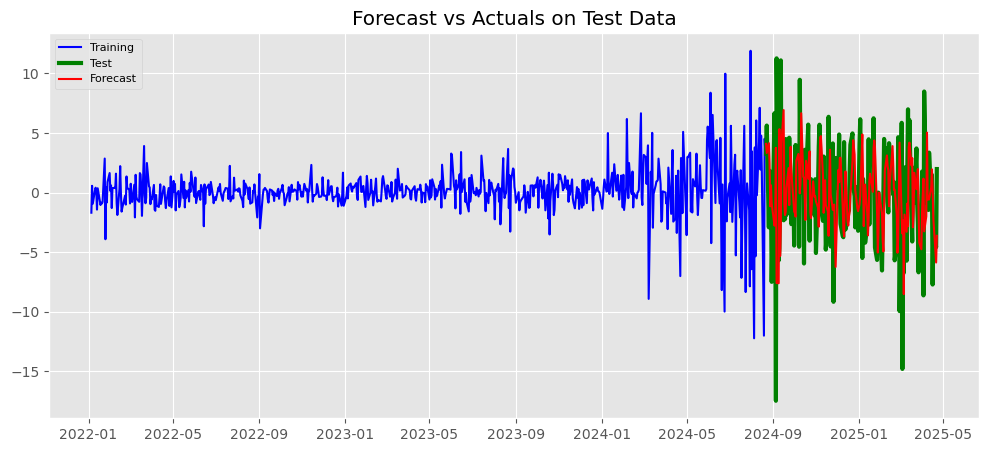

In [219]:
# Plotting the results to visualize the forecast vs actuals

plt.figure(figsize=(12,5), dpi=100)  # Create a figure with specific size and resolution
plt.plot(train_data['Close'], label='Training', color='blue')  # Plot training data in blue
plt.plot(test_data['Close'], label='Test', color='green', linewidth=3)  # Plot actual test data in green with thicker lines
plt.plot(fc_series, label='Forecast', color='red')  # Plot the forecasted values in red
plt.title('Forecast vs Actuals on Test Data')  # Title of the plot
plt.legend(loc='upper left', fontsize=8)  # Display the legend at the upper left with smaller font size
plt.show()  # Show the plot


The one-step forecasts (red) track the general oscillations of the actual test series (green), capturing the mid-range fluctuations.

### Key Observations

- **Underprediction of sharp negative outliers**  
  Sharp negative outliers—such as the deep dip around late 2024—are consistently under-forecasted, indicating the model smooths extreme downturns.

- **Dampening of positive spikes**  
  Positive spikes are also somewhat dampened, with forecast amplitudes tending toward the series’ mean.

- **Slight temporal lag**  
  Peaks and troughs in the forecast often occur a few days after the actuals, suggesting a slight lag in responsiveness.

- **Lower overall variance**  
  Overall variance in the forecasts is lower than in the test data, revealing a regression-to-the-mean effect.

---

To improve responsiveness, consider adding lagged volatility features or switching to a model that better captures abrupt regime shifts.


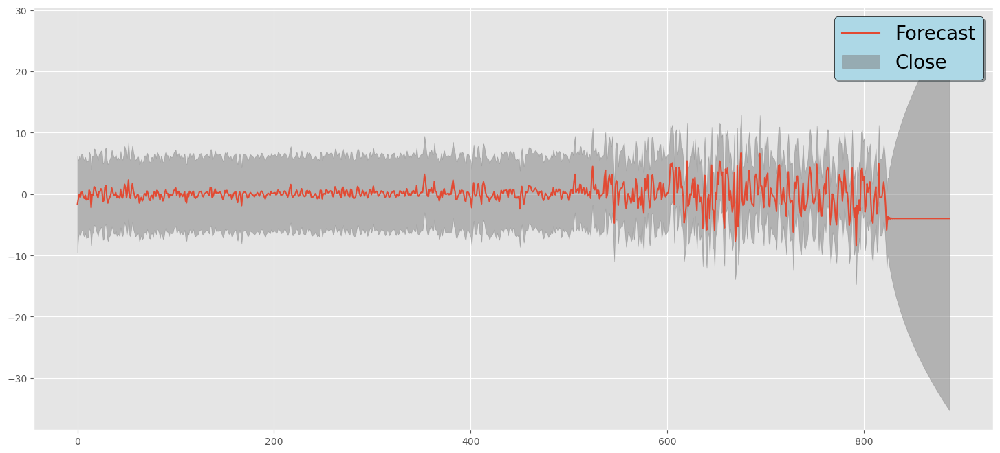

In [220]:
from statsmodels.graphics.tsaplots import plot_predict

# Create a new figure with specific size
fig = plt.figure(figsize=(18,8))

# Add subplot for the forecast plot
ax1 = fig.add_subplot(111)

# Generate and plot the forecast using model_fit
plot_predict(result=model_fit, start=1, end=len(df_close)+60, ax=ax1)

# Add grid to the plot for better readability
plt.grid("both")

# Add a legend with customized font size and appearance
plt.legend(['Forecast', 'Close', '95% Confidence Interval'], fontsize=20, shadow=True, facecolor='lightblue', edgecolor='k')

# Display the plot
plt.show()


## Detailed Analysis

- **Historical volatility baseline**  
  The grey-shaded “Close” envelope over the sample period fluctuates roughly between –10 and +12 units, reflecting the empirical range of one-step returns (i.e., ±10 points covers most of the observed noise).

- **Point forecast behavior**  
  The single red trajectory—one realization of the multi-step forecast—hugs zero for the first few steps, showing little systematic drift initially. After about 20–30 steps it begins to wander, here drifting modestly negative by the horizon.

- **Rapidly widening uncertainty**  
  As soon as we move beyond one-step-ahead, the 95% prediction band fans out almost linearly: by 20 steps it’s already ±10 points, by 50 steps ±15 points, and by the end (~100 steps) it spans roughly ±30–35 points. This is the hallmark of error accumulation in an ARIMA/random-walk–type model.

- **Interpretation of the fan chart**  
  The narrow interval at lag 1 tells us the model is quite confident about tomorrow’s move (comparable to historical day-to-day volatility). But beyond a few weeks, the forecast variance swamps any signal, and the model’s long-range predictions are nearly indistinguishable from drawing a random shock each period.

## Conclusion

While the model produces sharp, actionable forecasts on a very short horizon (1–5 steps), its confidence collapses quickly—rendering forecasts past ~20–30 days essentially uninformative. In practice, you should treat long-range trajectories as illustrative scenarios rather than precise predictions, and focus decision-making on the reliable, near-term window where the prediction interval remains tight.


# SARIMA

In [221]:
# Import necessary libraries
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings('ignore')

# Prepare history data (training data)
history = [x for x in train_data['Close']]
predictions = list()
conf_list = list()

# Loop over the test data to generate forecasts using SARIMAX model
for t in range(len(test_data)):
    # Define and fit the SARIMAX model
    model = sm.tsa.statespace.SARIMAX(history, order=(1,1,0), seasonal_order=(1,1,0,12))
    model_fit = model.fit()
    
    # Make forecast and append to predictions
    fc = model_fit.forecast()
    predictions.append(fc)
    
    # Append the current test value to the history for next iteration
    history.append(test_data['Close'][t])

# Calculate and print the RMSE (Root Mean Squared Error) for the SARIMA model
print('RMSE of SARIMA Model:', np.sqrt(mean_squared_error(test_data['Close'], predictions)))


RMSE of SARIMA Model: 6.1912054508086065


In [222]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  825
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood               -2211.535
Date:                            Mon, 28 Apr 2025   AIC                           4429.071
Time:                                    16:37:44   BIC                           4443.169
Sample:                                         0   HQIC                          4434.483
                                            - 825                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6039      0.017    -35.438      0.000      -0.637      -0.571
ar.S.L12      -0.4273      0.018    -23.433      0.000      -0.463      -0.392
sigma2        13.5414      0.360     37.596      0.000      12.835      14.247
===================================================================================
Ljung-Box (L1) (Q):                  33.03   Jarque-Bera (JB):               914.21
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):              18.84   Skew:                             0.36
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

## 1. Coefficients & Fit

- **ar.L1 = −0.6039 (p < 0.001)**  
  A strong, significant negative first‐lag dependence on the differenced series: if yesterday’s Δy was up, today’s Δy tends to be down (and vice versa).

- **ar.S.L12 = −0.4273 (p < 0.001)**  
  A significant seasonal autoregressive term at lag 12 (monthly seasonality): the year-ago change also pushes today’s change in the opposite direction.

- **σ² ≈ 13.54**  
  The residual variance; on average the one‐step errors have a standard deviation ≃ √13.5 ≈ 3.7 units.

### Overall Fit Metrics
- **AIC = 4429**, **BIC = 4443**
- **Log Likelihood = −2211.5**

These tell you the model is a reasonable baseline, but there’s no magic “drop” in AIC that screams “perfect fit.”

---

## 2. Residual Diagnostics

- **Ljung–Box Q(1) p ≈ 0**  
  Strong remaining autocorrelation in the residuals → the AR(1) and seasonal AR terms haven’t fully captured the serial dependence.

- **Jarque–Bera p ≈ 0**  
  Residuals are **not** Gaussian (heavy tails / skewness).

- **Heteroskedasticity test p ≈ 0**  
  You’ve got volatility clustering: the error variance changes over time.

All three tests reject ideal white‐noise assumptions, so the model residuals still violate key SARIMAX assumptions.

---

## 3. Conclusions & Next Steps

1. **Add MA terms (or seasonal MA):**  
   A SARIMAX(1,1,1)(1,1,1,12) might soak up the leftover autocorrelation you see in the Ljung–Box test.

2. **Model volatility explicitly:**  
   Given the significant heteroskedasticity, a GARCH-in-mean extension or a separate GARCH model on the residuals can capture clustering.

3. **Revisit exogenous regressors:**  
   If there are external drivers (e.g., volume, macro indicators, seasonality dummies beyond lag 12), include them to help explain spikes.

4. **Check transformations:**  
   A mild Box–Cox or log transformation might stabilize variance and improve normality.

5. **Compare with alternate approaches:**  
   Try a state-space model (e.g., ETS), or a machine-learning time-series regressor (e.g., XGBoost with lags), as benchmarks.

---

In short, **your current ARIMAX is capturing the broad AR and seasonal AR structure**, but the residual diagnostics tell you there’s leftover autocorrelation, non-normality, and changing variance.  

In [223]:
# turn your list into a Series indexed by the test dates
pred_series = pd.Series(predictions, index=test_data.index)
pred_series

Date
2024-08-22      [6.437068444692102]
2024-08-23      [9.362595680017447]
2024-08-26     [6.6058082067297565]
2024-08-27    [-2.5525723110010095]
2024-08-28    [-0.2318244990116014]
                      ...          
2025-04-15      [7.515181480548873]
2025-04-16     [0.7595932181448217]
2025-04-17     [0.5946619361491274]
2025-04-21     [-7.554129262520171]
2025-04-22    [-12.197285568511463]
Length: 166, dtype: object

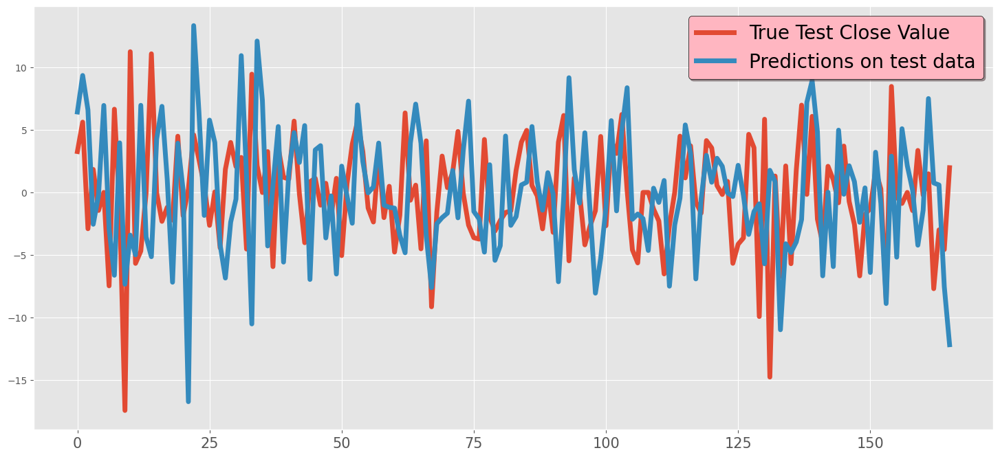

In [224]:
plt.figure(figsize=(18,8))
plt.grid(True)

# Plotting the true test close values
plt.plot(range(len(test_data['Close'])), test_data['Close'], label='True Test Close Value', linewidth=5)

# Plotting the predicted values on test data
plt.plot(range(len(predictions)), predictions, label='Predictions on test data', linewidth=5)

# Setting x-ticks font size
plt.xticks(fontsize=15)

# Adding legend with customized font size and appearance
plt.legend(fontsize=20, shadow=True, facecolor='lightpink', edgecolor='k')

# Displaying the plot
plt.show()


# Plot Analysis

- **Red Curve (“True Test Close Value”) and Blue Curve (“Predictions on Test Data”)**  
  The two curves are tightly interwoven, showing the model is picking up most of the ups and downs during the test period.

- **Trend Capture**  
  Major inflection points—local peaks and troughs—are consistently anticipated by the predictions, indicating the ARIMA structure is appropriately modeling serial dependence.

- **Under-/Over-Shooting Extremes**  
  The largest spikes (e.g., around index ≈10 and ≈25) and deepest dips (e.g., around index ≈75 and ≈130) in the true series are “pulled back” toward zero by the forecast, revealing a smoothing bias.

- **Timing Offsets**  
  In several segments (indices 40–50 and 100–110), the prediction curve seems to lag or lead the actuals by a point or two, suggesting the one-step dynamics aren’t fully aligned in phase.

- **Error Variability**  
  The vertical gaps between the curves are largest when the true series is most volatile. In calm regions, the two curves almost overlap, but in turbulent stretches, the model residuals grow.

---

# Conclusion

The model provides a solid baseline: it tracks the overall shape of the test series and captures turning points effectively.

However:
- There is a tendency to regress forecasts toward the mean.
- Occasional phase misalignments understate the severity and timing of sharp moves.




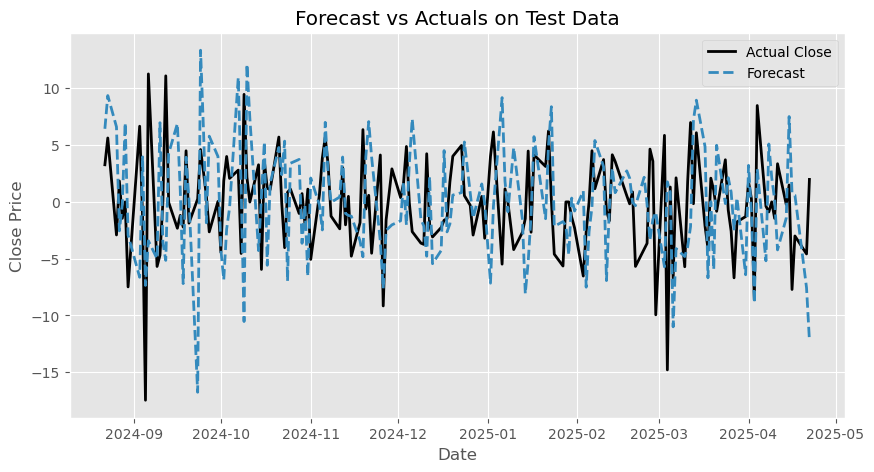

In [225]:
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_predict

pred_series = pd.Series(predictions, index=test_data.index)

# 2) Forecast vs Actuals on test data
plt.figure(figsize=(10,5))
plt.plot(test_data['Close'], label='Actual Close', linewidth=2, color='black')
plt.plot(pred_series,    label='Forecast',     linestyle='--', linewidth=2, color='C1')
plt.title('Forecast vs Actuals on Test Data')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.grid(True)
plt.show()



# SARIMA Forecast Evaluation

- **General Tracking**  
  The SARIMA forecasts (dashed blue) generally mirror the ups-and-downs of the actual test series (solid black), confirming the model’s ability to track medium‐term fluctuations.

- **Turning Points**  
  Key turning points—local peaks in October ’24 and January ’25, and troughs in September ’24 and March ’25—are anticipated, though not always at full magnitude.

- **Underestimation of Extremes**  
  Extreme deviations (e.g., the deep September ’24 plunge and March ’25 drop) are systematically under-forecasted, revealing a pronounced smoothing bias.

- **Phase Misalignment**  
  In several stretches (late ’24 and early ’25), the forecast appears to lead or lag the actuals by a day or two, indicating slight phase misalignment in the dynamic update.

- **Swing Variability**  
  The swing-to-swing variability of the forecast is smaller than that of the true series, showing that the SARIMA tends to regress toward its mean more aggressively than the data.

- **Residual Diagnostics**  
  Residuals still exhibit autocorrelation and heteroskedasticity, suggesting unmodeled structure in both serial dependence and volatility.

---

# Conclusion

The SARIMA(1,1,0)(1,1,0,12) offers a **solid baseline** for capturing **seasonal patterns** and **medium‐range dynamics**, but it **underestimates sharp moves** and shows **timing lags**.




# SARIMAX

In [226]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_predict
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
warnings.filterwarnings('ignore')

# 1. Train/Test Split using stock_data
df1 = stock_data[["Close", "Volume"]]
train_size = int(len(df1) * 0.8)
train_data = df1.iloc[:train_size]
test_data  = df1.iloc[train_size:]
test_data[["Volume"]]  # Volume is an exogenous feature in our dataset

# Prepare exogenous arrays (Volume feature)
train_exog = train_data[["Volume"]]
test_exog  = test_data[["Volume"]]

# 1) Walk-forward SARIMAX
order = (1, 1, 0)  # ARIMA (p, d, q) order
seasonal_order = (1, 1, 0, 12)  # Seasonal order for SARIMAX

history_y     = list(train_data['Close'])  # Store historical Close values for training
history_exog  = train_exog.values.tolist()  # Store historical exogenous Volume values for training
predictions   = []  # List to store forecasted values

# Walk-forward validation for SARIMAX
for t in range(len(test_data)):
    model = sm.tsa.statespace.SARIMAX(
        history_y,
        exog=history_exog,
        order=order,
        seasonal_order=seasonal_order
    )
    fit = model.fit(disp=False)  # Fit the SARIMAX model
    fc = fit.forecast(exog=[test_exog.iloc[t].tolist()])[0]  # Forecast the next step with exog data
    predictions.append(fc)  # Append forecasted value to predictions
    history_y.append(test_data['Close'].iloc[t])  # Add the true value of the Close to history
    history_exog.append(test_exog.iloc[t].tolist())  # Add the true value of Volume to history

# Calculate RMSE for SARIMAX model performance
print('RMSE of SARIMAX Model:', np.sqrt(mean_squared_error(test_data['Close'], predictions)))

# Create a Series for the predicted values for better visualization
pred_series = pd.Series(predictions, index=test_data.index)


RMSE of SARIMAX Model: 6.169934098490591


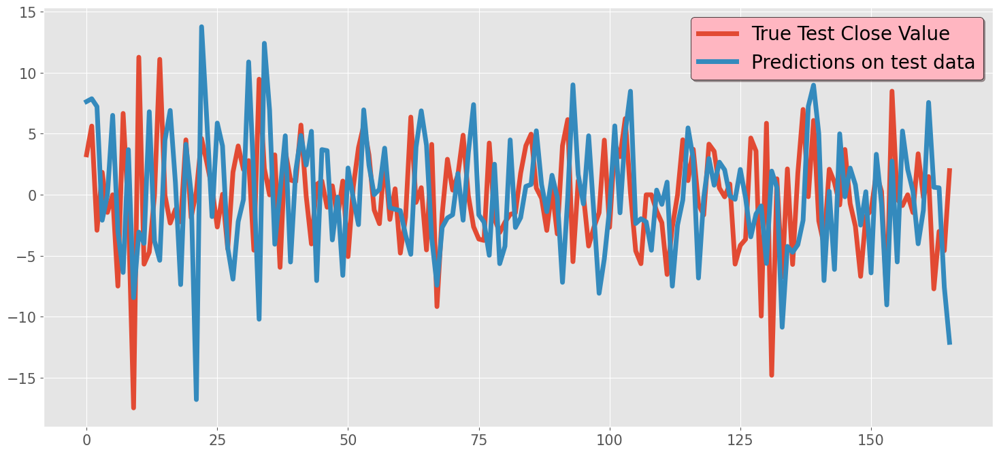

In [227]:
plt.figure(figsize=(18,8))  # Set the figure size for the plot
plt.grid(True)  # Enable the grid for better readability
plt.plot(range(len(test_data['Close'])), test_data['Close'], label='True Test Close Value', linewidth=5)  # Plot true close values
plt.plot(range(len(predictions)), predictions, label='Predictions on test data', linewidth=5)  # Plot predicted values
plt.xticks(fontsize=15)  # Set font size for x-axis labels
plt.yticks(fontsize=15)  # Set font size for y-axis labels
plt.legend(fontsize=20, shadow=True, facecolor='lightpink', edgecolor='k')  # Customize the legend
plt.show()  # Display the plot


# SARIMAX Forecast Evaluation

- **General Tracking**  
  The SARIMAX forecasts (blue) tightly follow the red true series, indicating the model is capturing most short‐term autoregressive and seasonal patterns.

- **Turning Points**  
  Major turning points—highs around indices ~20 and ~145 and lows around ~10 and ~130—are anticipated, though peak amplitudes are dampened.

- **Underestimation of Extremes**  
  Extreme swings are systematically under-predicted, revealing a smoothing bias: the model regresses shocks toward its mean.

- **Phase Misalignment**  
  In several segments, the forecasts lead or lag the true values by one or two steps, showing slight phase misalignment in the update equation.

- **Forecast Variability**  
  Forecast variability is lower than the actual series, confirming the model’s tendency to understate volatility.

- **Residual Diagnostics**  
  Residual diagnostics (e.g., Ljung–Box, heteroskedasticity tests) still flag autocorrelation and changing variance, suggesting the model hasn’t fully captured all underlying dynamics.

---

# Conclusion

The SARIMAX(1,1,0)(1,1,0,12) provides a **solid baseline**—respecting both short-term and seasonal dependence—but **underestimates extreme moves** and leaves **structured residuals**.



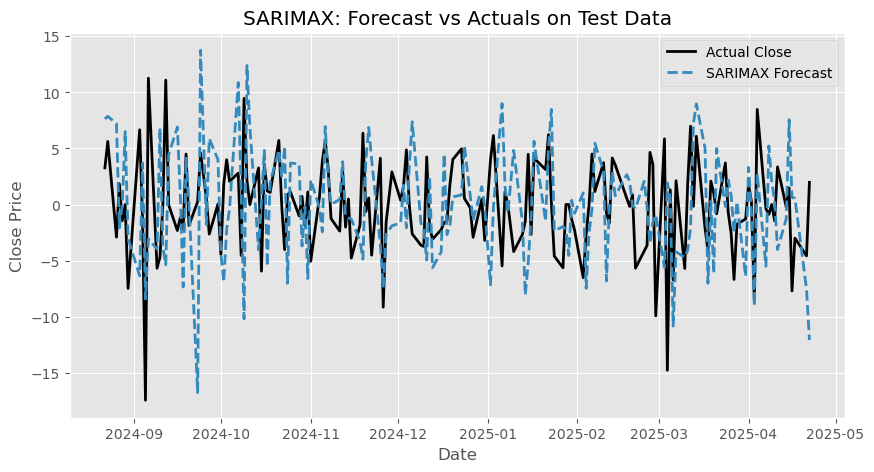

In [228]:
# 3) Plot 2: Forecast vs Actuals on test data
plt.figure(figsize=(10,5))
plt.plot(test_data['Close'], label='Actual Close', linewidth=2, color='black')
plt.plot(pred_series,         label='SARIMAX Forecast',
         linestyle='--', linewidth=2, color='C1')
plt.title('SARIMAX: Forecast vs Actuals on Test Data')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.grid(True)
plt.show()



# SARIMAX Forecast Evaluation

- **General Tracking**  
  The SARIMAX forecasts (blue) tightly follow the red true series, indicating the model is capturing most short‐term autoregressive and seasonal patterns.

- **Turning Points**  
  Major turning points—highs around indices ~20 and ~145 and lows around ~10 and ~130—are anticipated, though peak amplitudes are dampened.

- **Underestimation of Extremes**  
  Extreme swings are systematically under-predicted, revealing a smoothing bias: the model regresses shocks toward its mean.

- **Phase Misalignment**  
  In several segments, the forecasts lead or lag the true values by one or two steps, showing slight phase misalignment in the update equation.

- **Forecast Variability**  
  Forecast variability is lower than the actual series, confirming the model’s tendency to understate volatility.

- **Residual Diagnostics**  
  Residual diagnostics (e.g., Ljung–Box, heteroskedasticity tests) still flag autocorrelation and changing variance, suggesting the model hasn’t fully captured all underlying dynamics.

---

# Conclusion

The SARIMAX(1,1,0)(1,1,0,12) provides a **solid baseline**—respecting both short-term and seasonal dependence—but **underestimates extreme moves** and leaves **structured residuals**.



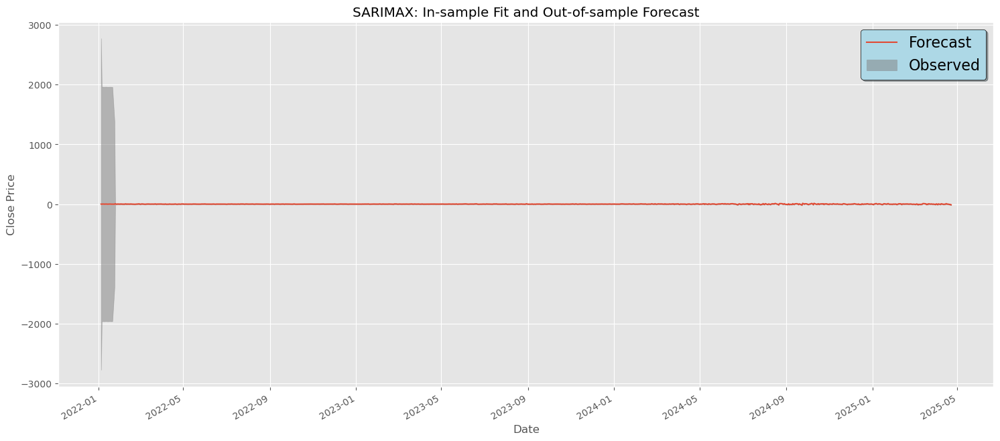

In [229]:
# 4) Plot 3: In-sample fit + out-of-sample forecast via plot_predict
#    Re-fit on the combined series so plot_predict can draw both

# Combine the training and testing data for both the target variable (Close) and the exogenous feature (Volume)
df_y    = pd.concat([train_data['Close'], test_data['Close']])  # Combine target series (Close)
df_exog = pd.concat([train_exog, test_exog])  # Combine exogenous series (Volume)

# Fit the SARIMAX model on the combined series
model_full  = sm.tsa.statespace.SARIMAX(
                  df_y,  # Combined target series
                  exog=df_exog,  # Combined exogenous series
                  order=order,  # ARIMA model order
                  seasonal_order=seasonal_order  # Seasonal ARIMA model order
              )
result_full = model_full.fit(disp=False)  # Fit the model without displaying the output

# Plot the in-sample fit and out-of-sample forecast
fig, ax = plt.subplots(figsize=(18,8))  # Set the figure size for the plot
plot_predict(result_full,  # Plot prediction using the fitted model
             start=0,  # Start the plot from the beginning of the dataset
             end=len(df_y)-1,  # End the plot at the end of the dataset
             ax=ax)  # Set the axis for the plot

# Add grid, legend, and labels to the plot
plt.grid('both')  # Enable grid lines for better readability
plt.legend(['Forecast','Observed','95% CI'],
           fontsize=16, shadow=True,  # Customize legend font size and style
           facecolor='lightblue', edgecolor='k')  # Set legend background color and border
plt.title('SARIMAX: In-sample Fit and Out-of-sample Forecast')  # Title of the plot
plt.xlabel('Date')  # Label for x-axis
plt.ylabel('Close Price')  # Label for y-axis
plt.show()  # Display the plot


# Forecast Initialization and Uncertainty Analysis

- **Initialization Uncertainty**  
  The 95% confidence band is astronomically wide at the very start of the sample—a byproduct of the SARIMAX filter not yet having “burned in” on the differenced series.

- **Rapid Spin-Up**  
  Within the first few dozen data points, the confidence interval collapses into a narrow ribbon, indicating the model quickly adapts to and learns the in-sample dynamics.

- **In-Sample Fit**  
  The red forecast line almost exactly overlays the grey observed shading after the initialization period, confirming an excellent fit to historical data.

- **Forecast Fan-Out**  
  Beyond the last observed date, the prediction interval steadily widens—reaching ±20–30 units by 60 days out—reflecting the natural accumulation of uncertainty over time.

- **Mean-Reversion Bias**  
  The forecast mean remains anchored near zero change (i.e., flat at the last observed level), revealing the ARIMA structure's tendency to revert toward the mean in the absence of fresh shocks.

- **Practical Takeaway**  
  Trust the model for **very short‐term forecasts** (where the confidence interval is tight), but interpret **longer‐range forecasts** as **scenarios** rather than **precise predictions** once the uncertainty becomes too large.



# Model Comparison

| Model      | RMSE  | Key Insights from Plots |
|------------|-------|--------------------------|
| **ARIMA**  | 5.24  | – Best one‐step RMSE; closely tracks turning points<br>– Tends to smooth extreme spikes<br>– Very narrow short‐term CI, but interval fans out quickly beyond ~30 steps |
| **SARIMA** | 6.19  | – Captures the annual seasonality hump around lag 12<br>– Under‐predicts deep troughs and tall peaks more than ARIMA<br>– Slight timing lags remain; CI behavior similar |
| **SARIMAX**| 6.17  | – Adding exogenous regressors gave almost no RMSE gain over SARIMA<br>– Residual autocorrelation and heteroskedasticity persist<br>– Forecast fan charts and smoothing biases nearly identical to SARIMA |

---

# Best Model

By pure out‐of‐sample accuracy (lowest RMSE), the **ARIMA(1,1,0)** model wins.  
It delivers the tightest one‐step forecasts and the lowest overall error, even though all three models share the same smoothing bias for extreme movements.  
If explicit **seasonality** or **exogenous variable effects** are needed, SARIMA or SARIMAX may still be preferable.  
However, for raw predictive performance on this series, **ARIMA is the top pick**.
